In [1]:
#pip install tensorflow ta autoimpute pytrends yfinance fredapi xgboost tradingview-ta twelvedata stock-indicators[pandas,matplotlib,plotly]

In [2]:
import yfinance as yf
import os
import pandas as pd
import fredapi
import numpy as np
import time
import statsmodels.formula.api as smf
import statsmodels.api as sm
import sklearn.metrics
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import xgboost
import tensorflow as tf
import requests
import time
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from plotly.subplots import make_subplots
from sklearn.linear_model import Lasso
from twelvedata import TDClient


In [3]:
#personal preference
pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)
pd.set_option('display.float_format', lambda x: f'{x:.3f}')

In [4]:
#get FRED API Key
file=(open(r'C:\Users\brian\api_keys\fred_api_key.txt','r'))
api_key=file.read()
api_key=api_key[:-1]

In [5]:
#Weekly data
from fredapi import Fred
fred = Fred(api_key)
balSheetData = fred.get_series('WALCL',name='date')
balSheetData.name='FED Balance Sheet Assets'
balSheetData=balSheetData.to_frame()
balSheetData.index=pd.to_datetime(balSheetData.index)

new_date_range=pd.date_range(start=min(balSheetData.index),end=max(balSheetData.index),freq="D")
balSheetData=balSheetData.reindex(labels=new_date_range,method='ffill')
balSheetData.index.name='date'
balSheetData["Balance_Sheet_percent_change_weekly"]=(((balSheetData['FED Balance Sheet Assets']-balSheetData['FED Balance Sheet Assets'].shift(+1)))/balSheetData['FED Balance Sheet Assets'].shift(+1)*100)
balSheetData["Balance_Sheet_rate_of_weekly_change"]=(balSheetData['Balance_Sheet_percent_change_weekly']-balSheetData['Balance_Sheet_percent_change_weekly'].shift(+1))
balSheetData["Balance-Sheet_percent_change_annual"]=(((balSheetData['FED Balance Sheet Assets']-balSheetData['FED Balance Sheet Assets'].shift(+52)))/balSheetData['FED Balance Sheet Assets'].shift(+52)*100)
#unwantedRows = (balSheetData[(balSheetData.index.day!=1)].index) & (balSheetData[(balSheetData.index.dayofweek!=2)].index)
#balSheetData=balSheetData.drop(unwantedRows)
balSheetData.tail()
#balSheetData.sort_values(by=("Balance_Sheet_percent_change_weekly"),ascending=False)

,FED Balance Sheet Assets,Balance_Sheet_percent_change_weekly,Balance_Sheet_rate_of_weekly_change,Balance-Sheet_percent_change_annual
date,,,,
2025-07-12,6661912.000,0.000,0.000,-0.401
2025-07-13,6661912.000,0.000,0.000,-0.401
2025-07-14,6661912.000,0.000,0.000,-0.401
2025-07-15,6661912.000,0.000,0.000,-0.401
2025-07-16,6659273.000,-0.040,-0.040,-0.440


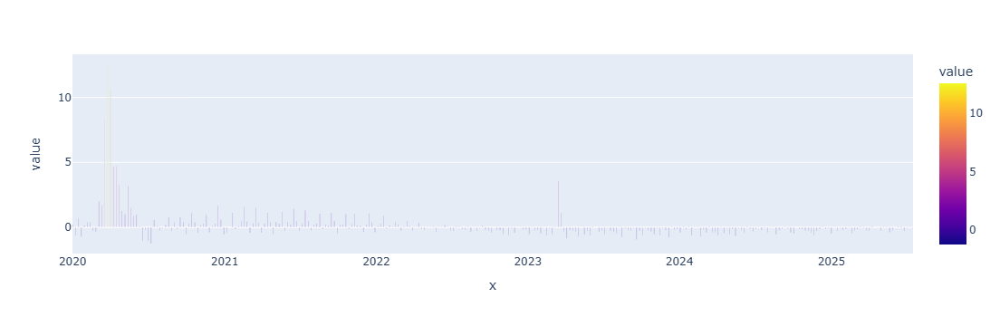

In [6]:
balSheetBar=px.bar(balSheetData.loc["2020":],x=balSheetData.loc['2020':].index,y=['Balance_Sheet_percent_change_weekly'],color='value')
balSheetBar.show()

In [7]:
#Quarterly data
fred = Fred(api_key)
gdpData = fred.get_series('GDPC1',name='date')
gdpData.name='Real_Gross_Domestic_Product'
gdpData=gdpData.to_frame()
#gdpData.index=pd.to_datetime(gdpData.index)
gdpData["GDP_percent_change_quarterly"]=(((gdpData['Real_Gross_Domestic_Product']-gdpData['Real_Gross_Domestic_Product'].shift(+1)))/gdpData['Real_Gross_Domestic_Product'].shift(+1)*100)
gdpData["GDP_rate_of_quarterly_change"]=(gdpData['GDP_percent_change_quarterly']-gdpData['GDP_percent_change_quarterly'].shift(+1))
gdpData["GDP_percent_change_annual"]=(((gdpData['Real_Gross_Domestic_Product']-gdpData['Real_Gross_Domestic_Product'].shift(+4)))/gdpData['Real_Gross_Domestic_Product'].shift(+4)*100)
gdpData.index.name='date'
#gdpData.sort_index(level="date",ascending=False)
gdpData.tail()

,Real_Gross_Domestic_Product,GDP_percent_change_quarterly,GDP_rate_of_quarterly_change,GDP_percent_change_annual
date,,,,
2024-01-01,23053.545,0.405,-0.384,2.902
2024-04-01,23223.906,0.739,0.334,3.037
2024-07-01,23400.294,0.760,0.021,2.719
2024-10-01,23542.349,0.607,-0.152,2.534
2025-01-01,23512.717,-0.126,-0.733,1.992


In [8]:
fred = Fred(api_key)
tgaData = fred.get_series('WTREGEN',name='date')
tgaData.name='Liabilities and Capital: Liabilities: Deposits with F.R. Banks, Other Than Reserve Balances: U.S. Treasury, General Account: Week Average'
tgaData=tgaData.to_frame()
tgaData.index=pd.to_datetime(tgaData.index)
tgaData.tail()
#units in billions

,"Liabilities and Capital: Liabilities: Deposits with F.R. Banks, Other Than Reserve Balances: U.S. Treasury, General Account: Week Average"
2025-06-18,337.762
2025-06-25,364.375
2025-07-02,359.516
2025-07-09,319.889
2025-07-16,296.247


This account is the primary operational account of the U.S. Treasury at the Federal Reserve. Virtually all U.S. government disbursements are made from this account. Some tax receipts, primarily individual and other tax payments made directly to the Treasury, are deposited in this account, and it is also used to collect funds from sales of Treasury debt.

In [10]:
tgaData[2010:].mean()

Liabilities and Capital: Liabilities: Deposits with F.R. Banks, Other Than Reserve Balances: U.S. Treasury, General Account: Week Average   641.228
dtype: float64

In [11]:
new_date_range=pd.date_range(start=min(tgaData.index),end=max(tgaData.index),freq="MS")
tgaData=tgaData.reindex(labels=new_date_range,method='ffill')
tgaData.index.name='date'
tgaData["TGA_Monthly_Change"]=tgaData["Liabilities and Capital: Liabilities: Deposits with F.R. Banks, Other Than Reserve Balances: U.S. Treasury, General Account: Week Average"]-tgaData["Liabilities and Capital: Liabilities: Deposits with F.R. Banks, Other Than Reserve Balances: U.S. Treasury, General Account: Week Average"].shift(+1)
tgaData["TGA_Rate_of_Monthly_Change"]=(tgaData["Liabilities and Capital: Liabilities: Deposits with F.R. Banks, Other Than Reserve Balances: U.S. Treasury, General Account: Week Average"]-tgaData["Liabilities and Capital: Liabilities: Deposits with F.R. Banks, Other Than Reserve Balances: U.S. Treasury, General Account: Week Average"].shift(+1))/tgaData["Liabilities and Capital: Liabilities: Deposits with F.R. Banks, Other Than Reserve Balances: U.S. Treasury, General Account: Week Average"].shift(+1)
tgaData.sort_index(level="date",ascending=False)
tgaData.tail()

,"Liabilities and Capital: Liabilities: Deposits with F.R. Banks, Other Than Reserve Balances: U.S. Treasury, General Account: Week Average",TGA_Monthly_Change,TGA_Rate_of_Monthly_Change
date,,,
2025-03-01,681.161,-103.045,-0.131
2025-04-01,360.177,-320.984,-0.471
2025-05-01,595.741,235.564,0.654
2025-06-01,467.204,-128.537,-0.216
2025-07-01,364.375,-102.829,-0.220


In [12]:
gdpData.loc["2000":].describe()

,Real_Gross_Domestic_Product,GDP_percent_change_quarterly,GDP_rate_of_quarterly_change,GDP_percent_change_annual
count,101.000,101.000,101.000,101.000
mean,18095.602,0.535,-0.017,2.215
std,2697.660,1.266,1.961,2.119
min,13878.147,-7.909,-6.745,-7.502
25%,16298.262,0.301,-0.482,1.679
50%,17469.650,0.612,-0.036,2.330
75%,20276.154,0.853,0.395,3.130
max,23542.349,7.830,15.739,12.239


In [13]:
gdpBar=px.bar(gdpData,x=gdpData.index,y=['GDP_percent_change_quarterly'],color='value')
gdpBar.show()

In [14]:
# Load API key from file
with open(r"C:\Users\brian\My Programs\API Keys\EOD API Key.txt", "r") as f:
    eod_api_key = f.read().strip()

# Function to download OHLCV data for SPY from EOD Historical Data
def download_spy_eod(retries=3, delay=10):
    url = f"https://eodhistoricaldata.com/api/eod/SPY.US"
    params = {
        'api_token': eod_api_key,
        'period': 'd',
        'fmt': 'json',
        'from': '2000-01-01'
    }
    for i in range(retries):
        try:
            response = requests.get(url, params=params)
            response.raise_for_status()
            data = response.json()
            return pd.DataFrame(data)
        except Exception as e:
            print(f"Error: {e}. Retrying in {delay} seconds...")
            time.sleep(delay)
    raise Exception("Failed to download SPY data from EOD after retries")

# Download and format
spData = download_spy_eod()
spData['date'] = pd.to_datetime(spData['date'])
spData.set_index('date', inplace=True)
spData.sort_index(inplace=True)

# Rename columns for consistency
spData.rename(columns={
    'open': 'Open',
    'high': 'High',
    'low': 'Low',
    'close': 'Close',
    'volume': 'Volume'
}, inplace=True)

# Compute percent changes
spData["SP_percent_change_daily"] = spData['Close'].pct_change(periods=1) * 100
spData["SP_percent_change_monthly"] = spData['Close'].pct_change(periods=21) * 100
spData["SP_percent_change_annual"] = spData['Close'].pct_change(periods=252) * 100

# Fill missing calendar days (like weekends) forward
full_date_range = pd.date_range(start=spData.index.min(), end=spData.index.max(), freq='D')
spData = spData.reindex(full_date_range)
spData = spData.ffill()
spData.index.name = 'date'

# Sort by best monthly returns
sp_best_days = spData.sort_values(['SP_percent_change_monthly'], ascending=False)

spData.tail()


,Open,High,Low,Close,adjusted_close,Volume,warning,SP_percent_change_daily,SP_percent_change_monthly,SP_percent_change_annual
date,,,,,,,,,,
2025-07-18,629.300,629.470,626.460,627.580,627.580,65621600.000,NaN,-0.073,5.029,NaN
2025-07-19,629.300,629.470,626.460,627.580,627.580,65621600.000,NaN,-0.073,5.029,NaN
2025-07-20,629.300,629.470,626.460,627.580,627.580,65621600.000,NaN,-0.073,5.029,NaN
2025-07-21,628.770,631.540,628.340,628.770,628.770,63375000.000,NaN,0.190,5.244,NaN
2025-07-22,629.100,629.730,626.190,628.860,628.860,59805900.000,Data is limited by one year as you have free s...,0.014,5.819,NaN


In [15]:
spData_date_range=pd.date_range(start=min(spData.index),end=max(spData.index), freq='BMS')
spDataMonthly=spData.reindex(labels=spData_date_range,method='ffill')
month_range=pd.date_range(start=min(spData.index),end=max(spData.index), freq='MS')
spDataMonthly=spDataMonthly.set_index(month_range)
spDataMonthly.index.name='date'
spDataMonthly.drop(columns=['SP_percent_change_annual','SP_percent_change_monthly','SP_percent_change_daily'])
spDataMonthly.tail()

,Open,High,Low,Close,adjusted_close,Volume,warning,SP_percent_change_daily,SP_percent_change_monthly,SP_percent_change_annual
date,,,,,,,,,,
2025-03-01,596.180,597.340,579.900,583.770,580.294,74249200.000,NaN,-1.752,-3.515,NaN
2025-04-01,557.450,562.940,553.680,560.970,559.308,54609600.000,NaN,0.282,-3.906,NaN
2025-05-01,560.370,564.070,557.860,558.470,556.815,63186100.000,NaN,0.709,-0.446,NaN
2025-06-01,587.760,592.790,585.060,592.710,590.954,61630500.000,NaN,0.563,6.131,NaN
2025-07-01,616.360,618.830,615.520,617.650,617.650,70030100.000,NaN,-0.032,4.795,NaN


In [16]:
spData.loc["2000":].describe()

,Open,High,Low,Close,adjusted_close,Volume,SP_percent_change_daily,SP_percent_change_monthly,SP_percent_change_annual
count,365.000,365.000,365.000,365.000,365.000,365.000,364.000,336.000,0.000
mean,579.542,582.830,575.954,579.670,575.921,61377446.575,0.048,1.264,NaN
std,26.708,25.315,27.875,26.679,27.395,29496997.946,1.263,4.524,NaN
min,489.190,521.700,481.800,496.480,495.009,26048700.000,-5.854,-12.422,NaN
25%,560.770,564.200,557.290,562.130,556.737,42268000.000,-0.413,-1.268,NaN
50%,584.070,585.950,580.600,583.630,579.160,57635800.000,0.143,2.071,NaN
75%,599.200,601.340,596.860,599.140,596.368,74079400.000,0.633,3.886,NaN
max,629.300,631.540,628.340,628.860,628.860,256611400.000,10.502,15.367,NaN


In [17]:
today=pd.to_datetime('today').normalize()

In [18]:
current_year=str(today.year)
current_month=today.month
current_day=today.day

spDataYTD=spData.loc['2000':current_year,:]
spDataYTD=spDataYTD.sort_values(by="SP_percent_change_daily",ascending=False)
spDataYTD.head()

,Open,High,Low,Close,adjusted_close,Volume,warning,SP_percent_change_daily,SP_percent_change_monthly,SP_percent_change_annual
date,,,,,,,,,,
2025-04-09,493.440,548.620,493.050,548.620,546.994,241867300.000,NaN,10.502,-1.313,NaN
2025-05-12,581.470,583.000,577.040,582.990,581.263,78993600.000,NaN,3.305,11.135,NaN
2025-04-22,520.140,529.300,519.190,527.250,525.688,75948100.000,NaN,2.602,-6.513,NaN
2024-11-06,589.200,591.930,585.390,591.040,585.551,68182000.000,NaN,2.487,3.118,NaN
2024-08-08,523.910,531.290,521.840,530.650,524.114,63276600.000,NaN,2.312,NaN,NaN


In [19]:
gdp_and_sp=pd.merge(gdpData,spDataMonthly,on='date',how='left')
gdp_and_sp.tail()

,Real_Gross_Domestic_Product,GDP_percent_change_quarterly,GDP_rate_of_quarterly_change,GDP_percent_change_annual,Open,High,Low,Close,adjusted_close,Volume,warning,SP_percent_change_daily,SP_percent_change_monthly,SP_percent_change_annual
date,,,,,,,,,,,,,,
2024-01-01,23053.545,0.405,-0.384,2.902,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-04-01,23223.906,0.739,0.334,3.037,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-07-01,23400.294,0.760,0.021,2.719,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-01,23542.349,0.607,-0.152,2.534,573.400,574.060,566.000,568.620,563.339,72668800.000,NaN,-0.896,0.876,NaN
2025-01-01,23512.717,-0.126,-0.733,1.992,589.910,590.640,584.420,586.080,582.591,57052700.000,NaN,-0.364,-2.733,NaN


In [20]:
gdp_and_sp.corr()

,Real_Gross_Domestic_Product,GDP_percent_change_quarterly,GDP_rate_of_quarterly_change,GDP_percent_change_annual,Open,High,Low,Close,adjusted_close,Volume,warning,SP_percent_change_daily,SP_percent_change_monthly,SP_percent_change_annual
Real_Gross_Domestic_Product,1.000,-0.123,-0.006,-0.224,-1.000,-1.000,-1.000,-1.000,-1.000,1.000,NaN,-1.000,1.000,NaN
GDP_percent_change_quarterly,-0.123,1.000,0.658,0.534,-1.000,-1.000,-1.000,-1.000,-1.000,1.000,NaN,-1.000,1.000,NaN
GDP_rate_of_quarterly_change,-0.006,0.658,1.000,-0.049,-1.000,-1.000,-1.000,-1.000,-1.000,1.000,NaN,-1.000,1.000,NaN
GDP_percent_change_annual,-0.224,0.534,-0.049,1.000,-1.000,-1.000,-1.000,-1.000,-1.000,1.000,NaN,-1.000,1.000,NaN
Open,-1.000,-1.000,-1.000,-1.000,1.000,1.000,1.000,1.000,1.000,-1.000,NaN,1.000,-1.000,NaN
High,-1.000,-1.000,-1.000,-1.000,1.000,1.000,1.000,1.000,1.000,-1.000,NaN,1.000,-1.000,NaN
Low,-1.000,-1.000,-1.000,-1.000,1.000,1.000,1.000,1.000,1.000,-1.000,NaN,1.000,-1.000,NaN
Close,-1.000,-1.000,-1.000,-1.000,1.000,1.000,1.000,1.000,1.000,-1.000,NaN,1.000,-1.000,NaN
adjusted_close,-1.000,-1.000,-1.000,-1.000,1.000,1.000,1.000,1.000,1.000,-1.000,NaN,1.000,-1.000,NaN
Volume,1.000,1.000,1.000,1.000,-1.000,-1.000,-1.000,-1.000,-1.000,1.000,NaN,-1.000,1.000,NaN


In [21]:
days_with_spikes_mean=spData.groupby([spData.index.month,spData.index.day]).agg(daily_returns= ("SP_percent_change_daily",'mean'))

In [22]:
days_with_spikes_mean.sort_values(by=('daily_returns'),ascending=False)

daily_returns
date date               
4    9            10.502
5    12            3.305
4    22            2.602
11   6             2.487
8    8             2.312
4    24            2.105
5    27            2.079
3    15            2.066
     14            2.066
     16            2.066
1    15            1.819
3    24            1.791
4    13            1.784
     12            1.784
     11            1.784
8    15            1.714
9    19            1.706
8    13            1.645
7    31            1.625
2    28            1.561
3    1             1.561
     2             1.561
4    23            1.550
5    3             1.484
     4             1.484
     2             1.484
1    5             1.250
     4             1.250
     3             1.250
11   5             1.209
7    27            1.120
     28            1.120
     26            1.120
9    9             1.120
12   25            1.112
     24            1.112
6    24            1.105
3    19            1.089
     5             1.075
8    25            1.063
     24            1.063
     23            1.063
2    13            1.056
6    7             1.027
     8             1.027
     6             1.027
9    11            1.026
1    17            1.004
     20            1.004
     19            1.004
     18            1.004
6    23            0.988
4    14            0.970
8    19            0.956
     31            0.955
9    2             0.955
     1             0.955
8    30            0.955
6    16            0.951
10   8             0.946
8    6             0.922
1    21            0.915
10   5             0.909
     4             0.909
     6             0.909
12   20            0.862
     22            0.862
     21            0.862
1    28            0.859
9    12            0.842
10   14            0.818
7    3             0.788
     6             0.788
     5             0.788
     4             0.788
6    26            0.782
11   7             0.773
12   11            0.773
3    17            0.771
4    27            0.723
     26            0.723
     25            0.723
5    1             0.709
     8             0.697
10   9             0.693
2    10            0.679
3    31            0.671
2    4             0.671
5    13            0.660
     17            0.633
     18            0.633
     16            0.633
4    2             0.633
     29            0.630
11   29            0.621
     30            0.621
12   1             0.621
     4             0.621
7    17            0.612
     9             0.600
12   23            0.599
10   12            0.599
     13            0.599
     11            0.599
1    6             0.576
6    3             0.570
     10            0.567
     2             0.563
1    22            0.562
3    7             0.560
     8             0.560
     9             0.560
1    23            0.546
11   21            0.537
1    30            0.537
3    12            0.531
9    13            0.522
     14            0.522
     15            0.522
11   26            0.522
6    29            0.497
     28            0.497
     27            0.497
5    15            0.488
6    30            0.478
7    2             0.453
8    9             0.441
     11            0.441
     10            0.441
9    10            0.436
10   16            0.435
11   8             0.433
     9             0.433
     10            0.433
12   16            0.427
11   1             0.422
     2             0.422
     3             0.422
5    7             0.421
11   18            0.410
2    5             0.405
9    30            0.401
6    12            0.397
9    26            0.396
5    29            0.395
10   20            0.385
     19            0.385
     18            0.385
11   19            0.366
2    6             0.348
8    21            0.344
11   25            0.339
7    16            0.334
8    14            0.315
11   23            0.310
     24            0.310
     22            0.310
10   28            0.309
2    18    

In [23]:
days_with_spikes_median=spData.groupby([spData.index.month,spData.index.day]).agg(daily_returns= ("SP_percent_change_daily",'median'))

In [24]:
days_with_spikes_median.sort_values(by=('daily_returns'),ascending=False)

daily_returns
date date               
4    9            10.502
5    12            3.305
4    22            2.602
11   6             2.487
8    8             2.312
4    24            2.105
5    27            2.079
3    15            2.066
     14            2.066
     16            2.066
1    15            1.819
3    24            1.791
4    13            1.784
     12            1.784
     11            1.784
8    15            1.714
9    19            1.706
8    13            1.645
7    31            1.625
2    28            1.561
3    1             1.561
     2             1.561
4    23            1.550
5    3             1.484
     4             1.484
     2             1.484
1    5             1.250
     4             1.250
     3             1.250
11   5             1.209
7    27            1.120
     28            1.120
     26            1.120
9    9             1.120
12   25            1.112
     24            1.112
6    24            1.105
3    19            1.089
     5             1.075
8    25            1.063
     24            1.063
     23            1.063
2    13            1.056
6    7             1.027
     8             1.027
     6             1.027
9    11            1.026
1    17            1.004
     20            1.004
     19            1.004
     18            1.004
6    23            0.988
4    14            0.970
8    19            0.956
     31            0.955
9    2             0.955
     1             0.955
8    30            0.955
6    16            0.951
10   8             0.946
8    6             0.922
1    21            0.915
10   5             0.909
     4             0.909
     6             0.909
12   20            0.862
     22            0.862
     21            0.862
1    28            0.859
9    12            0.842
10   14            0.818
7    3             0.788
     6             0.788
     5             0.788
     4             0.788
6    26            0.782
11   7             0.773
12   11            0.773
3    17            0.771
4    27            0.723
     26            0.723
     25            0.723
5    1             0.709
     8             0.697
10   9             0.693
2    10            0.679
3    31            0.671
2    4             0.671
5    13            0.660
     17            0.633
     18            0.633
     16            0.633
4    2             0.633
     29            0.630
11   29            0.621
     30            0.621
12   1             0.621
     4             0.621
7    17            0.612
     9             0.600
12   23            0.599
10   12            0.599
     13            0.599
     11            0.599
1    6             0.576
6    3             0.570
     10            0.567
     2             0.563
1    22            0.562
3    7             0.560
     8             0.560
     9             0.560
1    23            0.546
11   21            0.537
1    30            0.537
3    12            0.531
9    13            0.522
     14            0.522
     15            0.522
11   26            0.522
6    29            0.497
     28            0.497
     27            0.497
5    15            0.488
6    30            0.478
7    2             0.453
8    9             0.441
     11            0.441
     10            0.441
9    10            0.436
10   16            0.435
11   8             0.433
     9             0.433
     10            0.433
12   16            0.427
11   1             0.422
     2             0.422
     3             0.422
5    7             0.421
11   18            0.410
2    5             0.405
9    30            0.401
6    12            0.397
9    26            0.396
5    29            0.395
10   20            0.385
     19            0.385
     18            0.385
11   19            0.366
2    6             0.348
8    21            0.344
11   25            0.339
7    16            0.334
8    14            0.315
11   23            0.310
     24            0.310
     22            0.310
10   28            0.309
2    18    

In [25]:
current_month=today.month
current_day=today.day
spCurrentMonthData=spData[(spData.index.month==current_month)]
spCurrentMonthData.tail()

,Open,High,Low,Close,adjusted_close,Volume,warning,SP_percent_change_daily,SP_percent_change_monthly,SP_percent_change_annual
date,,,,,,,,,,
2025-07-18,629.300,629.470,626.460,627.580,627.580,65621600.000,NaN,-0.073,5.029,NaN
2025-07-19,629.300,629.470,626.460,627.580,627.580,65621600.000,NaN,-0.073,5.029,NaN
2025-07-20,629.300,629.470,626.460,627.580,627.580,65621600.000,NaN,-0.073,5.029,NaN
2025-07-21,628.770,631.540,628.340,628.770,628.770,63375000.000,NaN,0.190,5.244,NaN
2025-07-22,629.100,629.730,626.190,628.860,628.860,59805900.000,Data is limited by one year as you have free s...,0.014,5.819,NaN


In [26]:
#Monthly Fluctuation Patterns
spDailyDataLine=px.line(spCurrentMonthData,x=spCurrentMonthData.index,y=['Close'])
spDailyDataLine.show()

In [27]:
#See Daily fluctuations for current month
spDailyDataLine=px.line(spCurrentMonthData,x=spCurrentMonthData.index,y=['SP_percent_change_daily'])
spDailyDataLine.show()

In [28]:
day_total_daily_return=spData[(spData.index.month==current_month)&(spData.index.day==current_day)]
day_total_daily_return.tail(10)
#day_with_spikes.sort_values(by='SP_percent_change_monthly',ascending=False)

,Open,High,Low,Close,adjusted_close,Volume,warning,SP_percent_change_daily,SP_percent_change_monthly,SP_percent_change_annual
date,,,,,,,,,,
2024-07-23,554.540,556.740,553.280,553.780,546.959,34439600.000,NaN,NaN,NaN,NaN


In [29]:
spData[(spData.index.month==current_month)&(spData.index.day==current_day)].describe()

,Open,High,Low,Close,adjusted_close,Volume,SP_percent_change_daily,SP_percent_change_monthly,SP_percent_change_annual
count,1.000,1.000,1.000,1.000,1.000,1.000,0.000,0.000,0.000
mean,554.540,556.740,553.280,553.780,546.959,34439600.000,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,554.540,556.740,553.280,553.780,546.959,34439600.000,NaN,NaN,NaN
25%,554.540,556.740,553.280,553.780,546.959,34439600.000,NaN,NaN,NaN
50%,554.540,556.740,553.280,553.780,546.959,34439600.000,NaN,NaN,NaN
75%,554.540,556.740,553.280,553.780,546.959,34439600.000,NaN,NaN,NaN
max,554.540,556.740,553.280,553.780,546.959,34439600.000,NaN,NaN,NaN


In [30]:
spCurrentMonthDataW1=spData[(spData.index.month==current_month)&(spData.index.day<=7)]
spCurrentMonthDataW1.describe()

,Open,High,Low,Close,adjusted_close,Volume,SP_percent_change_daily,SP_percent_change_monthly,SP_percent_change_annual
count,7.000,7.000,7.000,7.000,7.000,7.000,7.000,7.000,0.000
mean,620.966,624.067,619.960,622.877,622.877,59374028.571,0.404,4.751,NaN
std,2.876,3.157,3.155,3.222,3.222,10637938.878,0.592,0.277,NaN
min,616.360,618.830,615.520,617.650,617.650,51065800.000,-0.745,4.153,NaN
25%,619.845,622.260,617.240,620.565,620.565,51065800.000,0.210,4.737,NaN
50%,622.450,626.280,622.430,625.340,625.340,51065800.000,0.788,4.907,NaN
75%,622.450,626.280,622.430,625.340,625.340,68270250.000,0.788,4.907,NaN
max,623.360,626.280,622.430,625.340,625.340,74814500.000,0.788,4.907,NaN


In [31]:
spCurrentMonthDataW2=spData[(spData.index.month==current_month)&(spData.index.day>7)&(spData.index.day<14)]
spCurrentMonthDataW2.describe()

,Open,High,Low,Close,adjusted_close,Volume,SP_percent_change_daily,SP_percent_change_monthly,SP_percent_change_annual
count,6.000,6.000,6.000,6.000,6.000,6.000,6.000,6.000,0.000
mean,622.757,624.713,621.338,623.513,623.513,62279583.333,-0.038,3.890,NaN
std,0.901,1.516,1.131,1.773,1.773,3276027.659,0.401,0.548,NaN
min,621.350,622.110,619.520,620.340,620.340,57529000.000,-0.352,3.406,NaN
25%,622.740,624.755,621.065,623.620,623.620,60186000.000,-0.352,3.406,NaN
50%,622.740,624.860,621.530,623.620,623.620,63670200.000,-0.203,3.783,NaN
75%,622.763,624.860,621.530,623.950,623.950,63670200.000,0.198,4.309,NaN
max,624.200,626.870,623.010,625.820,625.820,66113300.000,0.600,4.602,NaN


In [32]:
spCurrentMonthDataW3=spData[(spData.index.month==current_month)&(spData.index.day>=14)&(spData.index.day<21)]
spCurrentMonthDataW3.describe()

,Open,High,Low,Close,adjusted_close,Volume,SP_percent_change_daily,SP_percent_change_monthly,SP_percent_change_annual
count,7.000,7.000,7.000,7.000,7.000,7.000,7.000,7.000,0.000
mean,626.674,627.794,623.639,625.993,625.993,68707685.714,0.070,4.400,NaN
std,2.815,2.046,3.196,2.278,2.278,11209302.896,0.338,0.745,NaN
min,623.160,624.730,618.050,622.140,622.140,51898500.000,-0.427,3.046,NaN
25%,624.070,626.510,621.930,624.515,624.515,65621600.000,-0.073,4.054,NaN
50%,627.520,628.400,624.180,627.580,627.580,65621600.000,-0.073,4.559,NaN
75%,629.300,629.470,626.460,627.580,627.580,71601500.000,0.263,5.029,NaN
max,629.300,629.470,626.460,628.040,628.040,88987500.000,0.612,5.029,NaN


In [33]:
spCurrentMonthDataW4=spData[(spData.index.month==current_month)&(spData.index.day>=21)]
spCurrentMonthDataW4.describe()

,Open,High,Low,Close,adjusted_close,Volume,SP_percent_change_daily,SP_percent_change_monthly,SP_percent_change_annual
count,11.000,11.000,11.000,11.000,11.000,11.000,10.000,2.000,0.000
mean,560.975,564.009,558.076,560.176,554.685,55147118.182,0.195,5.531,NaN
std,33.828,33.092,34.489,34.198,36.888,11657263.028,1.141,0.406,NaN
min,541.350,547.050,537.450,538.410,531.778,34439600.000,-2.266,5.244,NaN
25%,542.280,547.190,540.890,543.220,536.529,50308700.000,-0.376,5.388,NaN
50%,546.260,547.460,541.490,544.440,537.734,53763800.000,0.124,5.531,NaN
75%,551.760,555.120,550.430,552.295,545.492,62266650.000,1.120,5.675,NaN
max,629.100,631.540,628.340,628.860,628.860,74515300.000,1.625,5.819,NaN


In [34]:
from plotly.offline import plot, iplot, init_notebook_mode
gdp = go.Bar(
    x=gdpData.index,
    y=gdpData['Real_Gross_Domestic_Product'],
    name="Real_Gross_Domestic_Product",
    marker=dict(
        color='rgb(153,0,17)')
)
SP_500 = go.Scatter(
    x=spData.index,
    y=spData["Close"],
    name='SP_500 Close',
    marker=dict(
        color='rgb(169,169,169)')

)

fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(gdp)
fig.add_trace(SP_500,secondary_y=True)
iplot(fig);
economyData=pd.merge(spData,gdpData,left_index=True,right_index=True)
economyData.corr()

#px.line(ppiData,x=ppiData.index,y=['PPI_percent_change_annual'])
#px.line(cpiData,x=cpiData.index,y=['CPI percent change annual'])
#px.line()

,Open,High,Low,Close,adjusted_close,Volume,warning,SP_percent_change_daily,SP_percent_change_monthly,SP_percent_change_annual,Real_Gross_Domestic_Product,GDP_percent_change_quarterly,GDP_rate_of_quarterly_change,GDP_percent_change_annual
Open,1.000,1.000,1.000,1.000,1.000,-1.000,NaN,1.000,-1.000,NaN,-1.000,-1.000,-1.000,-1.000
High,1.000,1.000,1.000,1.000,1.000,-1.000,NaN,1.000,-1.000,NaN,-1.000,-1.000,-1.000,-1.000
Low,1.000,1.000,1.000,1.000,1.000,-1.000,NaN,1.000,-1.000,NaN,-1.000,-1.000,-1.000,-1.000
Close,1.000,1.000,1.000,1.000,1.000,-1.000,NaN,1.000,-1.000,NaN,-1.000,-1.000,-1.000,-1.000
adjusted_close,1.000,1.000,1.000,1.000,1.000,-1.000,NaN,1.000,-1.000,NaN,-1.000,-1.000,-1.000,-1.000
Volume,-1.000,-1.000,-1.000,-1.000,-1.000,1.000,NaN,-1.000,1.000,NaN,1.000,1.000,1.000,1.000
warning,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SP_percent_change_daily,1.000,1.000,1.000,1.000,1.000,-1.000,NaN,1.000,-1.000,NaN,-1.000,-1.000,-1.000,-1.000
SP_percent_change_monthly,-1.000,-1.000,-1.000,-1.000,-1.000,1.000,NaN,-1.000,1.000,NaN,1.000,1.000,1.000,1.000
SP_percent_change_annual,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [35]:
#Weekly Data
fred = Fred(api_key)
claimsData = fred.get_series('ICSA',name='date')
claimsData.name='Initial Claims'
claimsData=claimsData.to_frame()
claimsData.index=pd.to_datetime(claimsData.index)
new_date_range=pd.date_range(start=min(claimsData.index),end=max(claimsData.index),freq="MS")
claimsData=claimsData.reindex(labels=new_date_range,method='ffill')
claimsData.index.name='date'
claimsData["Claims_Monthly_Change"]=claimsData["Initial Claims"]-claimsData["Initial Claims"].shift(+1)
claimsData["Claims_Rate_of_Monthly_Change"]=(claimsData["Initial Claims"]-claimsData["Initial Claims"].shift(+1))/claimsData["Initial Claims"].shift(+1)
claimsData.sort_index(level="date",ascending=False)
claimsData.tail()

,Initial Claims,Claims_Monthly_Change,Claims_Rate_of_Monthly_Change
date,,,
2025-03-01,224000.000,2000.000,0.009
2025-04-01,219000.000,-5000.000,-0.022
2025-05-01,241000.000,22000.000,0.100
2025-06-01,248000.000,7000.000,0.029
2025-07-01,232000.000,-16000.000,-0.065


In [36]:
claimsLine=px.line(claimsData,x=claimsData.index,y=['Claims_Monthly_Change'])
claimsLine.show()

In [37]:
#Monthly Data
fred = Fred(api_key)
jobopenData = fred.get_series('JTSJOL',name='date')
jobopenData.name='Job Openings Total Nonfarm'
jobopenData=jobopenData.to_frame()
jobopenData.index=pd.to_datetime(jobopenData.index)
jobopenData.index.name='date'
jobopenData["Job_Openings_Monthly_Change"]=jobopenData["Job Openings Total Nonfarm"]-jobopenData["Job Openings Total Nonfarm"].shift(+1)
jobopenData["Job_Openings_Rate_of_Monthly_Change"]=(jobopenData["Job_Openings_Monthly_Change"]-jobopenData["Job_Openings_Monthly_Change"].shift(+1))/jobopenData["Job_Openings_Monthly_Change"].shift(+1)
jobopenData.sort_index(level="date",ascending=False)
jobopenData.tail()

,Job Openings Total Nonfarm,Job_Openings_Monthly_Change,Job_Openings_Rate_of_Monthly_Change
date,,,
2025-01-01,7762.000,254.000,-1.486
2025-02-01,7480.000,-282.000,-2.110
2025-03-01,7200.000,-280.000,-0.007
2025-04-01,7395.000,195.000,-1.696
2025-05-01,7769.000,374.000,0.918


In [38]:
jobopenLine=px.line(jobopenData,x=jobopenData.index,y=['Job Openings Total Nonfarm'])
jobopenLine.show()

In [39]:
#Monthly Data
fred = Fred(api_key)
unempData = fred.get_series('UNRATE',name='date')
unempData.name='Unemployment_Rate'
unempData=unempData.to_frame()
unempData.index=pd.to_datetime(unempData.index)
unempData.index.name='date'
unempData["Unemp_Monthly_Change"]=unempData["Unemployment_Rate"]-unempData["Unemployment_Rate"].shift(+1)
unempData["Unemp_Rate_of_Monthly_Change"]=(unempData["Unemployment_Rate"]-unempData["Unemployment_Rate"].shift(+1))/unempData["Unemployment_Rate"].shift(+1)
unempData.sort_index(level="date",ascending=False)
unempData.tail()

,Unemployment_Rate,Unemp_Monthly_Change,Unemp_Rate_of_Monthly_Change
date,,,
2025-02-01,4.100,0.100,0.025
2025-03-01,4.200,0.100,0.024
2025-04-01,4.200,0.000,0.000
2025-05-01,4.200,0.000,0.000
2025-06-01,4.100,-0.100,-0.024


In [40]:
unempLine=px.line(unempData,x=unempData.index,y=['Unemployment_Rate'])
unempLine.show()

In [41]:
#Monthly Data
fred = Fred(api_key)
emPData = fred.get_series('PAYEMS',name='date')
emPData.name='All_Employees_Total_Nonfarm'
emPData=emPData.to_frame()
emPData.index=pd.to_datetime(emPData.index)
emPData.index.name='date'
emPData["Emp_Monthly_Change"]=emPData["All_Employees_Total_Nonfarm"]-emPData["All_Employees_Total_Nonfarm"].shift(+1)
emPData["Emp_Rate_of_Monthly_Change"]=(emPData["Emp_Monthly_Change"]-emPData["Emp_Monthly_Change"].shift(+1))/emPData["Emp_Monthly_Change"].shift(+1)
emPData.sort_index(level="date",ascending=False)
emPData.tail()

,All_Employees_Total_Nonfarm,Emp_Monthly_Change,Emp_Rate_of_Monthly_Change
date,,,
2025-02-01,159155.000,102.000,-0.081
2025-03-01,159275.000,120.000,0.176
2025-04-01,159433.000,158.000,0.317
2025-05-01,159577.000,144.000,-0.089
2025-06-01,159724.000,147.000,0.021


In [42]:
emPLine=px.bar(emPData,x=emPData.index,y=['Emp_Monthly_Change'])
emPLine.show()

In [43]:
emPBar=px.bar(emPData,x=emPData.index,y=["Emp_Monthly_Change"])
emPBar.show()

In [44]:
#Monthly Data
fred = Fred(api_key)
vacData = fred.get_series('LMJVTTUVUSM647S',name='date')
vacData.name='Total Unfilled Job Vacancies for the United States'
vacData=vacData.to_frame()
vacData.index=pd.to_datetime(vacData.index)
new_date_range=pd.date_range(start=min(vacData.index),end=max(vacData.index),freq="MS")
vacData=vacData.reindex(labels=new_date_range,method='ffill')
vacData.index.name='date'
vacData['Total Unfilled Job Vacancies for the United States_Monthly_Change']=(vacData["Total Unfilled Job Vacancies for the United States"]-vacData["Total Unfilled Job Vacancies for the United States"].shift(+1))
vacData['Total Unfilled Job Vacancies for the United States rate of Monthly_Change']=(vacData["Total Unfilled Job Vacancies for the United States_Monthly_Change"]-vacData["Total Unfilled Job Vacancies for the United States_Monthly_Change"].shift(+1))/vacData["Total Unfilled Job Vacancies for the United States_Monthly_Change"].shift(+1)
vacData.sort_index(level="date",ascending=False)
vacData.tail()

,Total Unfilled Job Vacancies for the United States,Total Unfilled Job Vacancies for the United States_Monthly_Change,Total Unfilled Job Vacancies for the United States rate of Monthly_Change
date,,,
2023-09-01,9307000.000,-51000.000,-1.092
2023-10-01,8685000.000,-622000.000,11.196
2023-11-01,8931000.000,246000.000,-1.395
2023-12-01,8889000.000,-42000.000,-1.171
2024-01-01,8863000.000,-26000.000,-0.381


In [45]:
vacBar=px.bar(vacData,x=vacData.index,y=["Total Unfilled Job Vacancies for the United States_Monthly_Change"])
vacBar.show()

In [46]:
#Daily Data Doesn't include weekends
fred = Fred(api_key)
tenyyData = fred.get_series('DGS10',name='date')
tenyyData.name='Market Yield on U.S. Treasury Securities at 10-Year Constant Maturity, Quoted on an Investment Basis'
tenyyData=tenyyData.to_frame()
tenyyData.index=pd.to_datetime(tenyyData.index)
tenyyData.index.name='date'
new_date_range=pd.date_range(start=min(tenyyData.index),end=max(tenyyData.index),freq="D")
tenyyData=tenyyData.reindex(labels=new_date_range,method='ffill')
tenyyData.index.name='date'
tenyyData["Daily Change"]=tenyyData["Market Yield on U.S. Treasury Securities at 10-Year Constant Maturity, Quoted on an Investment Basis"].shift(+1)-tenyyData["Market Yield on U.S. Treasury Securities at 10-Year Constant Maturity, Quoted on an Investment Basis"]
tenyyData.sort_index(level="date",ascending=False)
tenyyData.tail()

,"Market Yield on U.S. Treasury Securities at 10-Year Constant Maturity, Quoted on an Investment Basis",Daily Change
date,,
2025-07-17,4.470,-0.010
2025-07-18,4.440,0.030
2025-07-19,4.440,0.000
2025-07-20,4.440,0.000
2025-07-21,4.380,0.060


In [47]:
#Daily data
fred = Fred(api_key)
ycData = fred.get_series('T10Y2Y',name='date')
ycData.name='10-Year Treasury Constant Maturity Minus 2-Year Treasury Constant Maturity'
ycData=ycData.to_frame()
ycData.index=pd.to_datetime(ycData.index)
new_date_range=pd.date_range(start=min(ycData.index),end=max(ycData.index),freq="D")
ycData=ycData.reindex(labels=new_date_range,method='ffill')
ycData.index.name='date'
ycData.sort_index(level="date",ascending=False)
ycData.tail()

,10-Year Treasury Constant Maturity Minus 2-Year Treasury Constant Maturity
date,
2025-07-18,0.560
2025-07-19,0.560
2025-07-20,0.560
2025-07-21,0.530
2025-07-22,0.520


In [48]:
#anything below 0 indicates recessionary period
ycLine=px.line(ycData,x=ycData.index,y=['10-Year Treasury Constant Maturity Minus 2-Year Treasury Constant Maturity'])
ycLine.show()

In [49]:
# more accurate yield curve;anything below 0 indicates recessionary period
fred = Fred(api_key)
stycData = fred.get_series('T10Y3M',name='date')
stycData.name='10-Year Treasury Constant Maturity Minus 3-Month Treasury Constant Maturity'
stycData=stycData.to_frame()
stycData.index=pd.to_datetime(stycData.index)
new_date_range=pd.date_range(start=min(stycData.index),end=max(stycData.index),freq="D")
stycData=stycData.reindex(labels=new_date_range,method='ffill')
stycData.index.name='date'
stycData.sort_index(level="date",ascending=False)
stycData.tail()

,10-Year Treasury Constant Maturity Minus 3-Month Treasury Constant Maturity
date,
2025-07-18,0.040
2025-07-19,0.040
2025-07-20,0.040
2025-07-21,-0.030
2025-07-22,-0.060


In [50]:
#anything below 0 indicates recessionary period
stycLine=px.line(stycData,x=stycData.index,y=['10-Year Treasury Constant Maturity Minus 3-Month Treasury Constant Maturity'])
stycLine.show()

In [51]:
#Monthly Data
fred = Fred(api_key)
ppiData = fred.get_series('PPIFIS',name='date')
ppiData.name='Producer_Price_Index_by_Commodity_Final_Demand'
ppiData=ppiData.to_frame()
ppiData.index=pd.to_datetime(ppiData.index)
ppiData.index.name='date'
ppiData["PPI_percent_change_monthly"]=(((ppiData['Producer_Price_Index_by_Commodity_Final_Demand']-ppiData['Producer_Price_Index_by_Commodity_Final_Demand'].shift(+1)))/ppiData['Producer_Price_Index_by_Commodity_Final_Demand'].shift(+1)*100)
ppiData["PPI_rate_of_monthly_change"]=(ppiData['PPI_percent_change_monthly']-ppiData['PPI_percent_change_monthly'].shift(+1))
ppiData["PPI_percent_change_annual"]=(((ppiData['Producer_Price_Index_by_Commodity_Final_Demand']-ppiData['Producer_Price_Index_by_Commodity_Final_Demand'].shift(+12)))/ppiData['Producer_Price_Index_by_Commodity_Final_Demand'].shift(+12)*100)
ppiData.sort_index(level="date",ascending=False)
ppiData.tail()

,Producer_Price_Index_by_Commodity_Final_Demand,PPI_percent_change_monthly,PPI_rate_of_monthly_change,PPI_percent_change_annual
date,,,,
2025-02-01,148.323,0.129,-0.555,3.410
2025-03-01,148.167,-0.105,-0.234,3.243
2025-04-01,147.787,-0.256,-0.151,2.482
2025-05-01,148.228,0.298,0.555,2.754
2025-06-01,148.236,0.005,-0.293,2.352


In [52]:
#Monthly Data
from fredapi import Fred
fred = Fred(api_key)
coreppiData = fred.get_series('WPSFD4131',name='date')
coreppiData.name='Core_Producer_Price_Index_by_Commodity_Final_Demand'
coreppiData=coreppiData.to_frame()
coreppiData.index=pd.to_datetime(coreppiData.index)
coreppiData.index.name='date'
coreppiData["Core_PPI_percent_change_monthly"]=(((coreppiData['Core_Producer_Price_Index_by_Commodity_Final_Demand']-coreppiData['Core_Producer_Price_Index_by_Commodity_Final_Demand'].shift(+1)))/coreppiData['Core_Producer_Price_Index_by_Commodity_Final_Demand'].shift(+1)*100)
coreppiData["Core_PPI_rate_of_monthly_change"]=(coreppiData['Core_PPI_percent_change_monthly']-coreppiData['Core_PPI_percent_change_monthly'].shift(+1))
coreppiData["Core_PPI_percent_change_annual"]=(((coreppiData['Core_Producer_Price_Index_by_Commodity_Final_Demand']-coreppiData['Core_Producer_Price_Index_by_Commodity_Final_Demand'].shift(+12)))/coreppiData['Core_Producer_Price_Index_by_Commodity_Final_Demand'].shift(+12)*100)
coreppiData.sort_index(level="date",ascending=False)
coreppiData.tail()

,Core_Producer_Price_Index_by_Commodity_Final_Demand,Core_PPI_percent_change_monthly,Core_PPI_rate_of_monthly_change,Core_PPI_percent_change_annual
date,,,,
2025-02-01,256.755,0.320,0.242,2.330
2025-03-01,257.270,0.201,-0.119,2.328
2025-04-01,258.122,0.331,0.131,2.517
2025-05-01,258.941,0.317,-0.014,2.570
2025-06-01,259.689,0.289,-0.028,2.732


In [53]:
coreppiDataBar=px.bar(coreppiData,x=coreppiData.index,y=["Core_PPI_percent_change_annual"])
coreppiDataBar.show()

In [54]:
#MonthlyData
fred = Fred(api_key)
cpiData = fred.get_series('CPIAUCSL',name='date')
cpiData.name='Consumer Price Index for All Urban Consumers: All Items in U.S. City Average'
cpiData=cpiData.to_frame()
cpiData.index=pd.to_datetime(cpiData.index)
cpiData.index.name='date'
cpiData["CPI percent change monthly"]=(((cpiData['Consumer Price Index for All Urban Consumers: All Items in U.S. City Average']-cpiData['Consumer Price Index for All Urban Consumers: All Items in U.S. City Average'].shift(+1)))/cpiData['Consumer Price Index for All Urban Consumers: All Items in U.S. City Average'].shift(+1)*100)
cpiData["CPI_percent_change_monthly_difference"]=(cpiData['CPI percent change monthly']-cpiData['CPI percent change monthly'].shift(+1))
cpiData["CPI_monthly_rate_of_change"]=(cpiData['CPI percent change monthly']-cpiData['CPI percent change monthly'].shift(+1))/cpiData['CPI percent change monthly'].shift(+1)
cpiData["CPI percent change annual"]=(((cpiData['Consumer Price Index for All Urban Consumers: All Items in U.S. City Average']-cpiData['Consumer Price Index for All Urban Consumers: All Items in U.S. City Average'].shift(+12)))/cpiData['Consumer Price Index for All Urban Consumers: All Items in U.S. City Average'].shift(+12)*100)
cpiData.sort_index(level="date",ascending=False)
#cpiData=cpiData.drop("2023-03-01")
cpiData.tail()

,Consumer Price Index for All Urban Consumers: All Items in U.S. City Average,CPI percent change monthly,CPI_percent_change_monthly_difference,CPI_monthly_rate_of_change,CPI percent change annual
date,,,,,
2025-02-01,319.775,0.216,-0.251,-0.538,2.814
2025-03-01,319.615,-0.050,-0.266,-1.232,2.406
2025-04-01,320.321,0.221,0.271,-5.415,2.334
2025-05-01,320.580,0.081,-0.140,-0.634,2.376
2025-06-01,321.500,0.287,0.206,2.549,2.673


In [55]:
#MonthlyData
fred = Fred(api_key)
coreCpiData = fred.get_series('CPILFESL',name='date')
coreCpiData.name='Consumer Price Index for All Urban Consumers: All Items Less Food and Energy in U.S. City Average'
coreCpiData =coreCpiData .to_frame()
coreCpiData .index=pd.to_datetime(coreCpiData .index)
coreCpiData .index.name='date'
coreCpiData["Core CPI percent change monthly"]=(((coreCpiData ['Consumer Price Index for All Urban Consumers: All Items Less Food and Energy in U.S. City Average']-coreCpiData['Consumer Price Index for All Urban Consumers: All Items Less Food and Energy in U.S. City Average'].shift(+1)))/coreCpiData['Consumer Price Index for All Urban Consumers: All Items Less Food and Energy in U.S. City Average'].shift(+1)*100)
coreCpiData["Core CPI_percent_change_monthly_difference"]=(coreCpiData["Core CPI percent change monthly"]-coreCpiData['Core CPI percent change monthly'].shift(+1))
coreCpiData["Core CPI_monthly_rate_of_change"]=(coreCpiData['Core CPI percent change monthly']-coreCpiData['Core CPI percent change monthly'].shift(+1))/coreCpiData['Core CPI percent change monthly'].shift(+1)
coreCpiData["Core CPI percent change annual"]=(((coreCpiData['Consumer Price Index for All Urban Consumers: All Items Less Food and Energy in U.S. City Average']-coreCpiData['Consumer Price Index for All Urban Consumers: All Items Less Food and Energy in U.S. City Average'].shift(+12)))/coreCpiData['Consumer Price Index for All Urban Consumers: All Items Less Food and Energy in U.S. City Average'].shift(+12)*100)
coreCpiData.sort_index(level="date",ascending=False)
coreCpiData.tail()

,Consumer Price Index for All Urban Consumers: All Items Less Food and Energy in U.S. City Average,Core CPI percent change monthly,Core CPI_percent_change_monthly_difference,Core CPI_monthly_rate_of_change,Core CPI percent change annual
date,,,,,
2025-02-01,325.475,0.227,-0.220,-0.492,3.144
2025-03-01,325.659,0.057,-0.170,-0.751,2.809
2025-04-01,326.430,0.237,0.180,3.188,2.782
2025-05-01,326.854,0.130,-0.107,-0.451,2.767
2025-06-01,327.600,0.228,0.098,0.757,2.908


In [56]:
from plotly.offline import plot, iplot, init_notebook_mode
ppi = go.Bar(
    x=ppiData.index,
    y=ppiData['PPI_percent_change_monthly'],
    name="PPI percent change monthly",
    marker=dict(
        color='rgb(155,155,255)')
)
cpi = go.Scatter(
    x=cpiData.index,
    y=cpiData["CPI percent change monthly"],
    name='CPI percent change monthy',
    marker=dict(
        color='rgb(255,155,155)')
)
fig = make_subplots()
fig.add_trace(ppi)
fig.add_trace(cpi)
iplot(fig)

#px.line(ppiData,x=ppiData.index,y=['PPI_percent_change_annual'])
#px.line(cpiData,x=cpiData.index,y=['CPI percent change annual'])
#px.line()

In [57]:
cpiLine=px.line(cpiData,x=cpiData.index,y=['Consumer Price Index for All Urban Consumers: All Items in U.S. City Average'])
cpiLine.show()

In [58]:
cpiLine=px.line(cpiData,x=cpiData.index,y=['CPI percent change annual'])
cpiLine.show()

In [59]:
cpiLine=px.line(cpiData,x=cpiData.index,y=['CPI percent change monthly'])
cpiLine.show()
#anything below 0.16 is good news

In [60]:
#Monthly Data
fred = Fred(api_key)
pceExpData = fred.get_series('PCE',name='date')
pceExpData.name='Personal Consumption Expenditures'
pceExpData=pceExpData.to_frame()
pceExpData.index=pd.to_datetime(pceExpData.index)
pceExpData.index.name='date'
pceExpData["PCE Exp percent change monthly"]=(((pceExpData['Personal Consumption Expenditures']-pceExpData['Personal Consumption Expenditures'].shift(+1)))/pceExpData['Personal Consumption Expenditures'].shift(+1)*100)
pceExpData["PCE Exp monthly change percentage"]=(pceExpData['PCE Exp percent change monthly']-pceExpData['PCE Exp percent change monthly'].shift(+1))
pceExpData["PCE Exp monthly rate of change"]=(pceExpData['PCE Exp percent change monthly']-pceExpData['PCE Exp percent change monthly'].shift(+1))/pceExpData['PCE Exp percent change monthly'].shift(+1)
pceExpData["PCE Exp percent change annual"]=(((pceExpData['Personal Consumption Expenditures']-pceExpData['Personal Consumption Expenditures'].shift(+12)))/pceExpData['Personal Consumption Expenditures'].shift(+12)*100)
pceExpData.sort_index(level="date",ascending=False)
#pceExpData=pceExpData.drop('2023-04-01')
pceExpData.tail()

,Personal Consumption Expenditures,PCE Exp percent change monthly,PCE Exp monthly change percentage,PCE Exp monthly rate of change,PCE Exp percent change annual
date,,,,,
2025-01-01,20370.000,-0.187,-1.042,-1.218,5.498
2025-02-01,20436.300,0.325,0.512,-2.743,5.273
2025-03-01,20578.500,0.696,0.370,1.138,5.244
2025-04-01,20622.000,0.211,-0.484,-0.696,5.197
2025-05-01,20592.700,-0.142,-0.353,-1.672,4.546


In [61]:
#Monthly Data
fred = Fred(api_key)
pceData = fred.get_series('PCEPI',name='date')
pceData.name='Personal Consumption Expenditures: Chain-type Price Index'
pceData=pceData.to_frame()
pceData.index=pd.to_datetime(pceData.index)
pceData.index.name='date'
pceData["PCE percent change monthly"]=(((pceData['Personal Consumption Expenditures: Chain-type Price Index']-pceData['Personal Consumption Expenditures: Chain-type Price Index'].shift(+1)))/pceData['Personal Consumption Expenditures: Chain-type Price Index'].shift(+1)*100)
pceData["PCE monthly change percentage"]=(pceData['PCE percent change monthly']-pceData['PCE percent change monthly'].shift(+1))
pceData["PCE monthly rate of change"]=(pceData['PCE percent change monthly']-pceData['PCE percent change monthly'].shift(+1))/pceData['PCE percent change monthly'].shift(+1)
pceData["PCE percent change annual"]=(((pceData['Personal Consumption Expenditures: Chain-type Price Index']-pceData['Personal Consumption Expenditures: Chain-type Price Index'].shift(+12)))/pceData['Personal Consumption Expenditures: Chain-type Price Index'].shift(+12)*100)
pceData.sort_index(level="date",ascending=False)
#pceData=pceData.drop('2023-04-01')
pceData.tail()

,Personal Consumption Expenditures: Chain-type Price Index,PCE percent change monthly,PCE monthly change percentage,PCE monthly rate of change,PCE percent change annual
date,,,,,
2025-01-01,125.239,0.377,0.079,0.267,2.558
2025-02-01,125.772,0.426,0.049,0.130,2.676
2025-03-01,125.791,0.015,-0.410,-0.965,2.342
2025-04-01,125.939,0.118,0.103,6.788,2.195
2025-05-01,126.110,0.136,0.018,0.154,2.342


In [62]:
pceBar=px.bar(pceData,x=pceData.index,y=['PCE percent change annual'])
pceBar.show()

In [63]:
pceMonthlyBar=px.bar(pceData,x=pceData.index,y=['PCE percent change monthly'])
pceMonthlyBar.show()
#should expect monthly change of roughly 16% to maintain 2%yoy inflation target

In [64]:
#Monthly Data
fred = Fred(api_key)
corepceData = fred.get_series('PCEPILFE',name='date')
corepceData.name='Personal Consumption Expenditures Excluding Food and Energy'
corepceData=corepceData.to_frame()
corepceData.index=pd.to_datetime(corepceData.index)
corepceData.index.name='date'
corepceData["CorePCE percent change monthly"]=(((corepceData['Personal Consumption Expenditures Excluding Food and Energy']-corepceData['Personal Consumption Expenditures Excluding Food and Energy'].shift(+1)))/corepceData['Personal Consumption Expenditures Excluding Food and Energy'].shift(+1)*100)
corepceData["CorePCE monthly change percentage"]=(corepceData['CorePCE percent change monthly']-corepceData['CorePCE percent change monthly'].shift(+1))
corepceData["CorePCE monthly rate of change"]=(corepceData['CorePCE percent change monthly']-corepceData['CorePCE percent change monthly'].shift(+1))/corepceData['CorePCE percent change monthly'].shift(+1)
corepceData["CorePCE percent change annual"]=(((corepceData['Personal Consumption Expenditures Excluding Food and Energy']-corepceData['Personal Consumption Expenditures Excluding Food and Energy'].shift(+12)))/corepceData['Personal Consumption Expenditures Excluding Food and Energy'].shift(+12)*100)
corepceData.sort_index(level="date",ascending=False)
corepceData.tail()

,Personal Consumption Expenditures Excluding Food and Energy,CorePCE percent change monthly,CorePCE monthly change percentage,CorePCE monthly rate of change,CorePCE percent change annual
date,,,,,
2025-01-01,124.407,0.344,0.131,0.614,2.707
2025-02-01,124.999,0.476,0.131,0.382,2.949
2025-03-01,125.118,0.095,-0.381,-0.800,2.700
2025-04-01,125.288,0.136,0.041,0.427,2.577
2025-05-01,125.512,0.179,0.043,0.316,2.678


In [65]:
#Anything below .20 is acceptable, ideal is below .16
from plotly.offline import plot, iplot, init_notebook_mode
pce = go.Bar(
    x=pceData.index,
    y=pceData['PCE percent change monthly'],
    name="PCE percent change monthly",
    marker=dict(
        color='rgb(155,155,255)')
)
cpi = go.Scatter(
    x=cpiData.index,
    y=cpiData["CPI percent change monthly"],
    name='CPI percent change monthly',
    marker=dict(
        color='rgb(255,155,155)')

)
ppi = go.Scatter(
    x=ppiData.index,
    y=ppiData['PPI_percent_change_monthly'],
    name="PPI percent change monthly",
    marker=dict(
        color='rgb(155,255,155)')
)
fig = make_subplots()
fig.add_trace(ppi)
fig.add_trace(cpi)
fig.add_trace(pce)

iplot(fig)

#px.line(ppiData,x=ppiData.index,y=['PPI_percent_change_annual'])
#px.line(cpiData,x=cpiData.index,y=['CPI percent change annual'])
#px.line()

In [66]:
#Anything below .20 is acceptable, ideal is below .16
from plotly.offline import plot, iplot, init_notebook_mode
corepce = go.Bar(
    x=corepceData.index,
    y=corepceData['CorePCE percent change monthly'],
    name="Core PCE percent change monthly",
    marker=dict(
        color='rgb(155,155,255)')
)
corecpi = go.Scatter(
    x=coreCpiData.index,
    y=coreCpiData["Core CPI percent change monthly"],
    name='Core CPI percent change monthly',
    marker=dict(
        color='rgb(255,155,155)')

)
coreppi = go.Scatter(
    x=coreppiData.index,
    y=coreppiData['Core_PPI_percent_change_monthly'],
    name="Core PPI percent change monthly",
    marker=dict(
        color='rgb(155,255,155)')
)
fig = make_subplots()
fig.add_trace(coreppi)
fig.add_trace(corecpi)
fig.add_trace(corepce)

iplot(fig)


In [67]:
corepceBar=px.bar(corepceData,x=corepceData.index,y=['CorePCE percent change annual'])
corepceBar.show()

In [68]:
#Monthly Data
fred = Fred(api_key)
retailData = fred.get_series('RSAFS',name='date')
retailData.name='Advance Retail Sales: Retail Trade and Food Services'
retailData=retailData.to_frame()
retailData.index=pd.to_datetime(retailData.index)
retailData.index.name='date'
retailData["retail rate change"]=(retailData['Advance Retail Sales: Retail Trade and Food Services']-retailData['Advance Retail Sales: Retail Trade and Food Services'].shift(+1))/(retailData['Advance Retail Sales: Retail Trade and Food Services'].shift(+1))*100
retailData.sort_index(level="date",ascending=False)
#retailData=retailData.drop('2023-03-01')
retailData.tail()

,Advance Retail Sales: Retail Trade and Food Services,retail rate change
date,,
2025-02-01,711757.000,0.042
2025-03-01,722572.000,1.519
2025-04-01,721789.000,-0.108
2025-05-01,715541.000,-0.866
2025-06-01,720106.000,0.638


In [69]:
#Daily Data
fred = Fred(api_key)
consLnData = fred.get_series('CCLACBW027SBOG',name='date')
consLnData.name='Consumer Loans: Credit Cards and Other Revolving Plans, All Commercial Banks'
consLnData=consLnData.to_frame()
consLnData.index=pd.to_datetime(consLnData.index)
consLnData.index.name='date'
consLnData["Consumer Loans: Credit Cards and Other Revolving Plans, All Commercial Banks monthly dollar change"]=(consLnData['Consumer Loans: Credit Cards and Other Revolving Plans, All Commercial Banks']-consLnData['Consumer Loans: Credit Cards and Other Revolving Plans, All Commercial Banks'].shift(+1))
consLnData["Consumer Loans: Credit Cards and Other Revolving Plans, All Commercial Banks monthly rate of change"]=(consLnData['Consumer Loans: Credit Cards and Other Revolving Plans, All Commercial Banks']-consLnData['Consumer Loans: Credit Cards and Other Revolving Plans, All Commercial Banks'].shift(+1))/(consLnData['Consumer Loans: Credit Cards and Other Revolving Plans, All Commercial Banks'].shift(+1))*100
consLnData.sort_index(level="date",ascending=False)
#retailData=retailData.drop('2023-03-01')
consLnData.tail()

,"Consumer Loans: Credit Cards and Other Revolving Plans, All Commercial Banks","Consumer Loans: Credit Cards and Other Revolving Plans, All Commercial Banks monthly dollar change","Consumer Loans: Credit Cards and Other Revolving Plans, All Commercial Banks monthly rate of change"
date,,,
2025-06-11,1095.970,2.164,0.198
2025-06-18,1094.349,-1.621,-0.148
2025-06-25,1093.435,-0.914,-0.084
2025-07-02,1089.717,-3.717,-0.340
2025-07-09,1095.276,5.559,0.510


In [70]:
#Daily FF Data
fred = Fred(api_key)
ffData = fred.get_series('DFF',name='date')
ffData.name='Federal Funds Effective Rate Daily'
ffData=ffData.to_frame()
ffData.index=pd.to_datetime(ffData.index)
ffData.index.name='date'
ffData.sort_index(level="date",ascending=False)
ffData2=fred.get_series('EFFR',name='date')
ffData2.name='Federal Funds Effective Rate Daily'
ffData2=ffData2.to_frame()
ffData2.index=pd.to_datetime(ffData2.index)
ffData2.index.name='date'
    
ffData["FF rate change"]=(ffData['Federal Funds Effective Rate Daily']-ffData['Federal Funds Effective Rate Daily'].shift(+1))
ffData.tail()

,Federal Funds Effective Rate Daily,FF rate change
date,,
2025-07-17,4.330,0.000
2025-07-18,4.330,0.000
2025-07-19,4.330,0.000
2025-07-20,4.330,0.000
2025-07-21,4.330,0.000


In [71]:
FFLine=px.line(ffData,x=ffData.index,y=['Federal Funds Effective Rate Daily'])
FFLine.show()

In [72]:
#Monthly Data
fred = Fred(api_key)
dollarData = fred.get_series('DTWEXBGS',name='date')
dollarData.name='Nominal Broad U.S. Dollar Index'
dollarData=dollarData.to_frame()
dollarData.index=pd.to_datetime(dollarData.index)
asset_date_range=pd.date_range(start=min(dollarData.index),end=max(dollarData.index), freq='B')
dollarData=dollarData.reindex(labels=asset_date_range,method='ffill')
dollarData=dollarData.fillna(method='ffill')
dollarData.index.name='date'
dollarData['Nominal Broad U.S. Dollar Index_daily_Change']=(dollarData["Nominal Broad U.S. Dollar Index"]-dollarData["Nominal Broad U.S. Dollar Index"].shift(+1))
dollarData['Nominal Broad U.S. Dollar Index rate of daily_Change']=(dollarData["Nominal Broad U.S. Dollar Index_daily_Change"]-dollarData["Nominal Broad U.S. Dollar Index_daily_Change"].shift(+1))/dollarData["Nominal Broad U.S. Dollar Index_daily_Change"].shift(+1)
dollarData['Nominal Broad U.S. Dollar Index_monthly_Change']=(dollarData["Nominal Broad U.S. Dollar Index"]-dollarData["Nominal Broad U.S. Dollar Index"].shift(+30))
dollarData.sort_index(level="date",ascending=False)
dollarData.tail()

C:\Users\brian\AppData\Local\Temp\ipykernel_18648\2831241902.py:9: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



,Nominal Broad U.S. Dollar Index,Nominal Broad U.S. Dollar Index_daily_Change,Nominal Broad U.S. Dollar Index rate of daily_Change,Nominal Broad U.S. Dollar Index_monthly_Change
date,,,,
2025-07-14,120.625,0.290,2.517,-0.924
2025-07-15,120.909,0.284,-0.019,-0.899
2025-07-16,120.823,-0.086,-1.304,-0.586
2025-07-17,121.042,0.219,-3.532,-0.276
2025-07-18,120.767,-0.274,-2.255,-0.754


In [73]:
dollarLine=px.line(dollarData,x=dollarData.index,y=['Nominal Broad U.S. Dollar Index_daily_Change'])
dollarLine.show()

In [74]:
dollar_days_with_spikes_mean=dollarData.groupby([dollarData.index.month,dollarData.index.day]).agg(daily_returns= ("Nominal Broad U.S. Dollar Index_daily_Change",'mean'))

In [75]:
dollar_days_with_spikes_mean.sort_values(by=('daily_returns'),ascending=False)

,,daily_returns
date,date,
11,12,0.308
10,22,0.267
9,21,0.256
7,5,0.249
9,26,0.217
5,12,0.213
12,15,0.199
3,7,0.198
11,9,0.197


In [76]:
dollar_days_with_spikes_median=dollarData.groupby([dollarData.index.month,dollarData.index.day]).agg(daily_returns= ("Nominal Broad U.S. Dollar Index_daily_Change",'median'))

In [77]:
dollar_days_with_spikes_median.sort_values(by=('daily_returns'),ascending=False)

daily_returns
date date               
5    9             0.242
10   27            0.229
5    12            0.226
11   13            0.218
10   3             0.215
12   8             0.211
10   22            0.210
11   12            0.209
     20            0.195
6    23            0.186
8    19            0.184
     29            0.183
12   15            0.182
8    22            0.181
7    5             0.181
8    5             0.178
7    6             0.172
2    20            0.162
5    18            0.158
9    26            0.158
     25            0.157
8    26            0.156
10   31            0.156
6    10            0.156
5    31            0.156
11   19            0.151
3    19            0.150
9    21            0.148
     8             0.146
     24            0.146
6    13            0.144
8    15            0.140
2    6             0.137
8    30            0.136
2    10            0.136
4    15            0.134
11   23            0.133
10   23            0.132
8    1             0.131
12   6             0.129
3    15            0.128
10   26            0.126
11   9             0.123
2    18            0.122
     4             0.121
3    8             0.121
7    30            0.119
     24            0.112
1    9             0.112
3    4             0.111
11   8             0.110
6    17            0.106
8    3             0.105
11   5             0.100
12   21            0.097
10   6             0.091
1    22            0.090
11   17            0.089
1    5             0.088
     7             0.088
8    6             0.088
5    2             0.087
8    7             0.086
     13            0.082
3    1             0.082
12   17            0.076
6    15            0.074
8    25            0.071
3    10            0.070
4    19            0.069
     7             0.068
9    29            0.067
5    4             0.065
12   18            0.065
5    14            0.063
2    5             0.063
4    22            0.062
10   7             0.061
2    28            0.061
4    6             0.060
1    29            0.059
5    1             0.059
2    8             0.059
6    4             0.059
12   2             0.058
1    27            0.057
3    14            0.056
5    17            0.054
11   21            0.053
2    26            0.053
10   24            0.053
11   3             0.052
3    28            0.050
     7             0.050
7    7             0.050
9    23            0.049
8    17            0.048
1    16            0.047
8    12            0.044
12   11            0.044
7    11            0.043
4    4             0.041
     21            0.041
1    8             0.040
9    17            0.039
4    18            0.039
2    7             0.039
11   27            0.038
5    11            0.038
9    20            0.038
12   19            0.036
3    29            0.036
8    14            0.033
6    12            0.032
12   12            0.032
1    3             0.031
2    24            0.029
4    25            0.028
10   18            0.028
5    13            0.027
7    17            0.027
1    26            0.026
2    19            0.026
3    22            0.026
6    8             0.025
11   16            0.025
7    22            0.025
5    8             0.023
2    3             0.021
3    23            0.021
4    27            0.021
     23            0.019
11   26            0.017
5    22            0.017
8    28            0.014
5    7             0.013
1    15            0.013
10   1             0.013
7    25            0.012
12   13            0.011
8    4             0.010
5    23            0.010
10   8             0.009
12   31            0.008
10   2             0.008
9    15            0.008
6    20            0.007
12   9             0.007
5    28            0.006
10   12            0.006
3    5             0.006
4    30            0.005
3    2             0.005
10   9             0.004
2    16            0.003
12   14            0.002
9    11            0.001
5    27            0.001
9    3     

In [78]:
#daily doesn't include weekends
fred = Fred(api_key)
bbbData = fred.get_series('BAMLC0A4CBBBEY',name='date')
bbbData.name='ICE_BofA_BBB_US_Corporate_Index_Effective_Yield'
bbbData=bbbData.to_frame()
bbbData.index=pd.to_datetime(bbbData.index)
new_date_range=pd.date_range(start=min(bbbData.index),end=max(bbbData.index),freq="D")
bbbData=bbbData.reindex(labels=new_date_range,method='ffill')
bbbData.index.name='date'
bbbData.sort_index(level="date",ascending=False)
bbbData.tail()

,ICE_BofA_BBB_US_Corporate_Index_Effective_Yield
date,
2025-07-18,5.300
2025-07-19,5.300
2025-07-20,5.300
2025-07-21,5.260
2025-07-22,5.230


In [79]:
#daily doesn't include weekends
fred = Fred(api_key)
hyBondData = fred.get_series('BAMLH0A0HYM2',name='date')
hyBondData.name='ICE BofA US High Yield Index Option-Adjusted Spread'
hyBondData=hyBondData.to_frame()
bbbData.index=pd.to_datetime(bbbData.index)
new_date_range=pd.date_range(start=min(hyBondData.index),end=max(hyBondData.index),freq="D")
hyBondData=hyBondData.reindex(labels=new_date_range,method='ffill')
hyBondData.index.name='date'
hyBondData.sort_index(level="date",ascending=False)
hyBondData.tail()

,ICE BofA US High Yield Index Option-Adjusted Spread
date,
2025-07-18,2.930
2025-07-19,2.930
2025-07-20,2.930
2025-07-21,2.890
2025-07-22,2.900


In [80]:
#Monthly Data
fred = Fred(api_key)
csData = fred.get_series('UMCSENT',name='date')
csData.name='Consumer Sentiment'
csData=csData.to_frame()
csData.index=pd.to_datetime(csData.index)
csData.index.name='date'
csData['Consumer_Sentiment_Monthly_Change']=(csData["Consumer Sentiment"]-csData["Consumer Sentiment"].shift(+1))
csData['Consumer_Sentiment_rate_of_Monthly_Change']=(csData["Consumer Sentiment"]-csData["Consumer Sentiment"].shift(+1))/csData["Consumer Sentiment"].shift(+1)
csData.sort_index(level="date",ascending=False)
csData.tail()

,Consumer Sentiment,Consumer_Sentiment_Monthly_Change,Consumer_Sentiment_rate_of_Monthly_Change
date,,,
2025-01-01,71.700,-2.300,-0.031
2025-02-01,64.700,-7.000,-0.098
2025-03-01,57.000,-7.700,-0.119
2025-04-01,52.200,-4.800,-0.084
2025-05-01,52.200,0.000,0.000


In [81]:
#Monthly Data
fred = Fred(api_key)
psData = fred.get_series('PSAVERT',name='date')
psData.name='Personal Saving Rate'
psData=psData.to_frame()
psData.index=pd.to_datetime(psData.index)
psData.index.name='date'
psData['Personal Saving Rate Monthly_Change']=(psData["Personal Saving Rate"]-psData["Personal Saving Rate"].shift(+1))
psData['Personal Saving Rate rate_of_Monthly_Change']=(psData["Personal Saving Rate"]-psData["Personal Saving Rate"].shift(+1))/psData["Personal Saving Rate"].shift(+1)
psData.sort_index(level="date",ascending=False)
psData.tail()

,Personal Saving Rate,Personal Saving Rate Monthly_Change,Personal Saving Rate rate_of_Monthly_Change
date,,,
2025-01-01,4.200,0.700,0.200
2025-02-01,4.400,0.200,0.048
2025-03-01,4.400,0.000,0.000
2025-04-01,4.900,0.500,0.114
2025-05-01,4.500,-0.400,-0.082


In [82]:
#Monthly Data
fred = Fred(api_key)
mfData = fred.get_series('MANEMP',name='date')
mfData.name='All Employees_Manufacturing'
mfData=mfData.to_frame()
mfData.index=pd.to_datetime(mfData.index)
mfData.index.name='date'
mfData['All Employees_Manufacturing_Monthly_Change']=(mfData["All Employees_Manufacturing"]-mfData["All Employees_Manufacturing"].shift(+1))
mfData['All Employees_Manufacturing_rate_of_Monthly_Change']=(mfData["All Employees_Manufacturing"]-mfData["All Employees_Manufacturing"].shift(+1))/mfData["All Employees_Manufacturing"].shift(+1)
mfData=mfData.dropna()
mfData.sort_index(level="date",ascending=False)
mfData.tail()

,All Employees_Manufacturing,All Employees_Manufacturing_Monthly_Change,All Employees_Manufacturing_rate_of_Monthly_Change
date,,,
2025-02-01,12763.000,8.000,0.001
2025-03-01,12764.000,1.000,0.000
2025-04-01,12764.000,0.000,0.000
2025-05-01,12757.000,-7.000,-0.001
2025-06-01,12750.000,-7.000,-0.001


In [83]:
#Monthly Data
fred = Fred(api_key)
mortgData = fred.get_series('MORTGAGE30US',name='date')
mortgData.name='30-Year Fixed Rate Mortgage Average in the United States'
mortgData=mortgData.to_frame()
mortgData.index=pd.to_datetime(mortgData.index)
new_date_range=pd.date_range(start=min(mortgData.index),end=max(mortgData.index),freq="MS")
mortgData=mortgData.reindex(labels=new_date_range,method='ffill')
mortgData.index.name='date'
mortgData['30-Year Fixed Rate Mortgage Average in the United States_Monthly_Change']=(mortgData["30-Year Fixed Rate Mortgage Average in the United States"]-mortgData["30-Year Fixed Rate Mortgage Average in the United States"].shift(+1))
mortgData['30-Year Fixed Rate Mortgage Average in the United States rate of Monthly_Change']=(mortgData["30-Year Fixed Rate Mortgage Average in the United States_Monthly_Change"]-mortgData["30-Year Fixed Rate Mortgage Average in the United States_Monthly_Change"].shift(+1))/mortgData["30-Year Fixed Rate Mortgage Average in the United States_Monthly_Change"].shift(+1)
mortgData.sort_index(level="date",ascending=False)
mortgData.tail()

,30-Year Fixed Rate Mortgage Average in the United States,30-Year Fixed Rate Mortgage Average in the United States_Monthly_Change,30-Year Fixed Rate Mortgage Average in the United States rate of Monthly_Change
date,,,
2025-03-01,6.760,-0.190,-2.900
2025-04-01,6.650,-0.110,-0.421
2025-05-01,6.760,0.110,-2.000
2025-06-01,6.890,0.130,0.182
2025-07-01,6.770,-0.120,-1.923


In [84]:
mortgLine=px.line(mortgData,x=mortgData.index,y=['30-Year Fixed Rate Mortgage Average in the United States'])
mortgLine.show()

In [85]:
#Monthly Data
fred = Fred(api_key)
defData = fred.get_series('GFDEGDQ188S',name='date')
defData.name='Federal Debt: Total Public Debt as Percent of Gross Domestic Product'
defData=defData.to_frame()
defData.index=pd.to_datetime(defData.index)
new_date_range=pd.date_range(start=min(defData.index),end=max(defData.index),freq="MS")
defData=defData.reindex(labels=new_date_range,method='ffill')
defData.index.name='date'
defData['Federal Debt: Total Public Debt as Percent of Gross Domestic Product_Monthly_Change']=(defData["Federal Debt: Total Public Debt as Percent of Gross Domestic Product"]-defData["Federal Debt: Total Public Debt as Percent of Gross Domestic Product"].shift(+1))
defData['Federal Debt: Total Public Debt as Percent of Gross Domestic rate of Monthly_Change']=(defData["Federal Debt: Total Public Debt as Percent of Gross Domestic Product_Monthly_Change"]-defData["Federal Debt: Total Public Debt as Percent of Gross Domestic Product_Monthly_Change"].shift(+1))/defData["Federal Debt: Total Public Debt as Percent of Gross Domestic Product_Monthly_Change"].shift(+1)
defData.sort_index(level="date",ascending=False)
defData.tail()

,Federal Debt: Total Public Debt as Percent of Gross Domestic Product,Federal Debt: Total Public Debt as Percent of Gross Domestic Product_Monthly_Change,Federal Debt: Total Public Debt as Percent of Gross Domestic rate of Monthly_Change
date,,,
2024-09-01,120.731,0.000,NaN
2024-10-01,121.850,1.119,inf
2024-11-01,121.850,0.000,-1.000
2024-12-01,121.850,0.000,NaN
2025-01-01,120.867,-0.983,-inf


In [86]:
DefLine=px.line(defData,x=defData.index,y=['Federal Debt: Total Public Debt as Percent of Gross Domestic Product'])
DefLine.show()

In [87]:
#Quarterly Data
fred = Fred(api_key)
cardData = fred.get_series('DRCCLACBS',name='date')
cardData.name='Delinquency Rate on Credit Card Loans, All Commercial Banks'
cardData=cardData.to_frame()
cardData.index=pd.to_datetime(cardData.index)
new_date_range=pd.date_range(start=min(cardData.index),end=max(cardData.index),freq="MS")
cardData=cardData.reindex(labels=new_date_range,method='ffill')
cardData.index.name='date'
cardData['Delinquency Rate on Credit Card Loans, All Commercial Banks_Monthly_Change']=(cardData["Delinquency Rate on Credit Card Loans, All Commercial Banks"]-cardData["Delinquency Rate on Credit Card Loans, All Commercial Banks"].shift(+1))
cardData['Delinquency Rate on Credit Card Loans, All Commercial Banks rate of Monthly_Change']=(cardData["Delinquency Rate on Credit Card Loans, All Commercial Banks_Monthly_Change"]-cardData["Delinquency Rate on Credit Card Loans, All Commercial Banks_Monthly_Change"].shift(+1))/cardData["Delinquency Rate on Credit Card Loans, All Commercial Banks_Monthly_Change"].shift(+1)
cardData.sort_index(level="date",ascending=False)
cardData.tail()

,"Delinquency Rate on Credit Card Loans, All Commercial Banks","Delinquency Rate on Credit Card Loans, All Commercial Banks_Monthly_Change","Delinquency Rate on Credit Card Loans, All Commercial Banks rate of Monthly_Change"
date,,,
2024-09-01,3.200,0.000,NaN
2024-10-01,3.080,-0.120,-inf
2024-11-01,3.080,0.000,-1.000
2024-12-01,3.080,0.000,NaN
2025-01-01,3.050,-0.030,-inf


In [88]:
CardLine=px.line(cardData,x=cardData.index,y=['Delinquency Rate on Credit Card Loans, All Commercial Banks'])
CardLine.show()

In [89]:
#Monthly Data
fred = Fred(api_key)
vixData = fred.get_series('VXVCLS',name='date')
vixData.name='CBOE S&P 500 3-Month Volatility Index'
vixData=vixData.to_frame()
vixData.index=pd.to_datetime(vixData.index)
new_date_range=pd.date_range(start=min(vixData.index),end=max(vixData.index),freq="MS")
vixData=vixData.reindex(labels=new_date_range,method='ffill')
vixData.index.name='date'
vixData['CBOE S&P 500 3-Month Volatility Index_Monthly Change']=(vixData["CBOE S&P 500 3-Month Volatility Index"]-vixData["CBOE S&P 500 3-Month Volatility Index"].shift(+1))
vixData['CBOE S&P 500 3-Month Volatility Index rate of Monthly_Change']=(vixData["CBOE S&P 500 3-Month Volatility Index_Monthly Change"]-vixData["CBOE S&P 500 3-Month Volatility Index_Monthly Change"].shift(+1))/vixData["CBOE S&P 500 3-Month Volatility Index_Monthly Change"].shift(+1)
vixData.sort_index(level="date",ascending=False)
vixData.tail()

,CBOE S&P 500 3-Month Volatility Index,CBOE S&P 500 3-Month Volatility Index_Monthly Change,CBOE S&P 500 3-Month Volatility Index rate of Monthly_Change
date,,,
2025-03-01,20.180,1.750,NaN
2025-04-01,21.820,1.640,-0.063
2025-05-01,25.490,3.670,1.238
2025-06-01,21.380,-4.110,-2.120
2025-07-01,19.510,-1.870,-0.545


In [90]:
#Monthly Data
fred = Fred(api_key)
copperData = fred.get_series('WPUSI019011',name='date')
copperData.name='Producer Price Index by Commodity: Special Indexes: Copper and Copper Products'
copperData=copperData.to_frame()
copperData.index=pd.to_datetime(copperData.index)
new_date_range=pd.date_range(start=min(copperData.index),end=max(copperData.index),freq="MS")
copperData=copperData.reindex(labels=new_date_range,method='ffill')
copperData.index.name='date'
copperData['Producer Price Index by Commodity: Special Indexes: Copper and Copper Products_Monthly Change']=(copperData["Producer Price Index by Commodity: Special Indexes: Copper and Copper Products"]-copperData["Producer Price Index by Commodity: Special Indexes: Copper and Copper Products"].shift(+1))
copperData['Producer Price Index by Commodity: Special Indexes: Copper and Copper Products rate of Monthly_Change']=(copperData["Producer Price Index by Commodity: Special Indexes: Copper and Copper Products_Monthly Change"]-copperData["Producer Price Index by Commodity: Special Indexes: Copper and Copper Products_Monthly Change"].shift(+1))/copperData["Producer Price Index by Commodity: Special Indexes: Copper and Copper Products_Monthly Change"].shift(+1)
copperData.sort_index(level="date",ascending=False)
copperData.tail()

,Producer Price Index by Commodity: Special Indexes: Copper and Copper Products,Producer Price Index by Commodity: Special Indexes: Copper and Copper Products_Monthly Change,Producer Price Index by Commodity: Special Indexes: Copper and Copper Products rate of Monthly_Change
date,,,
2025-02-01,568.097,5.457,-0.689
2025-03-01,582.484,14.387,1.636
2025-04-01,582.168,-0.316,-1.022
2025-05-01,581.960,-0.208,-0.342
2025-06-01,594.758,12.798,-62.529


In [91]:
#daily doesn't include weekends
fred = Fred(api_key)
rrData = fred.get_series('RRPONTTLD',name='date')
rrData.name='Overnight Reverse Repurchase Agreements: Total Securities Sold by the Federal Reserve in the Temporary Open Market Operations'
rrData=rrData.to_frame()
rrData.index=pd.to_datetime(rrData.index)
new_date_range=pd.date_range(start=min(rrData.index),end=max(rrData.index),freq="D")
rrData=rrData.reindex(labels=new_date_range,method='ffill')
rrData.index.name='date'
rrData['Reverse Repurchase Agreement Monthly Change']=(rrData["Overnight Reverse Repurchase Agreements: Total Securities Sold by the Federal Reserve in the Temporary Open Market Operations"]-rrData["Overnight Reverse Repurchase Agreements: Total Securities Sold by the Federal Reserve in the Temporary Open Market Operations"].shift(+1))
rrData['Reverse Repurchase rate of Monthly_Change']=(rrData["Reverse Repurchase Agreement Monthly Change"]-rrData["Reverse Repurchase Agreement Monthly Change"].shift(+1))/rrData["Reverse Repurchase Agreement Monthly Change"].shift(+1)
rrData.sort_index(level="date",ascending=False)
rrData.sort_values(by='Reverse Repurchase Agreement Monthly Change')
rrData.tail()

,Overnight Reverse Repurchase Agreements: Total Securities Sold by the Federal Reserve in the Temporary Open Market Operations,Reverse Repurchase Agreement Monthly Change,Reverse Repurchase rate of Monthly_Change
date,,,
2025-07-19,199.298,0.000,-1.000
2025-07-20,199.298,0.000,NaN
2025-07-21,213.666,14.368,inf
2025-07-22,196.374,-17.292,-2.204
2025-07-23,189.632,-6.742,-0.610


In [92]:
rrLine=px.line(rrData,x=rrData.index,y=['Reverse Repurchase Agreement Monthly Change'])
rrLine.show()

In [93]:
#daily doesn't include weekends
fred = Fred(api_key)
tightCreditData = fred.get_series('DRTSCILM',name='date')
tightCreditData.name='Net Percentage of Domestic Banks Tightening Standards for Commercial and Industrial Loans to Large and Middle-Market Firms'
tightCreditData=tightCreditData.to_frame()
tightCreditData.index=pd.to_datetime(tightCreditData.index)
tightCreditData.index.name='date'
tightCreditData['Credit Tightening quarterly Change']=(tightCreditData["Net Percentage of Domestic Banks Tightening Standards for Commercial and Industrial Loans to Large and Middle-Market Firms"]-tightCreditData["Net Percentage of Domestic Banks Tightening Standards for Commercial and Industrial Loans to Large and Middle-Market Firms"].shift(+1))
tightCreditData['Credit Tightening rate of Quarterly_Change']=(tightCreditData["Net Percentage of Domestic Banks Tightening Standards for Commercial and Industrial Loans to Large and Middle-Market Firms"]-tightCreditData["Net Percentage of Domestic Banks Tightening Standards for Commercial and Industrial Loans to Large and Middle-Market Firms"].shift(+1))/tightCreditData["Net Percentage of Domestic Banks Tightening Standards for Commercial and Industrial Loans to Large and Middle-Market Firms"].shift(+1)
tightCreditData.sort_values(by='Credit Tightening quarterly Change',ascending=False)
tightCreditData.tail()

,Net Percentage of Domestic Banks Tightening Standards for Commercial and Industrial Loans to Large and Middle-Market Firms,Credit Tightening quarterly Change,Credit Tightening rate of Quarterly_Change
date,,,
2024-04-01,15.600,1.100,0.076
2024-07-01,7.900,-7.700,-0.494
2024-10-01,0.000,-7.900,-1.000
2025-01-01,6.200,6.200,inf
2025-04-01,18.500,12.300,1.984


In [94]:
# from pytrends.request import TrendReq
# pytrends=TrendReq(hl='en-US',tz=360)

# kw_list=["Recession"]

# pytrends.build_payload(kw_list,cat=0,timeframe='today 5-y')

# googleData=pytrends.interest_over_time()
# googleData=googleData.reset_index()
# googleData=googleData.set_index('date')
# googleData=googleData.iloc[:,0:1]
# googleData.index=pd.to_datetime(googleData.index)
# new_date_range=pd.date_range(start=min(googleData.index),end=max(googleData.index),freq="D")
# googleData=googleData.reindex(labels=new_date_range,method='ffill')
# googleData.index.name='date'
# googleData.columns=["google searches for: stock market"]
# googleData.tail()

In [95]:
# fig=px.line(googleData,x=googleData.index,y=['google searches for: stock market'],title='Keyword Web Search Interest Over Time')
# fig.show()

In [96]:
from tradingview_ta import TA_Handler, Interval
output=TA_Handler(symbol='SPX',
                  screener='america',
                 exchange='NYSE',
                 interval=Interval.INTERVAL_1_MONTH)

In [113]:
# Daily Asset Data
asset = spData
asset.index = pd.to_datetime(asset.index)
asset.index=asset.index.date

# Use business day frequency for the date range
asset_date_range = pd.date_range(start=asset.index.min(), end=asset.index.max(), freq='B')
asset = asset.reindex(labels=asset_date_range, method='ffill')


# Calculate moving averages, variance, and other metrics
asset['moving_average_200'] = asset['Close'].rolling(200).mean()
asset['moving_average_50'] = asset['Close'].rolling(50).mean()
asset['Variance'] = (asset["High"] - asset['Low'])
asset['rolling_average_volume'] = asset['Volume'].rolling(5).mean()
asset['std_dev_100'] = asset['Close'].rolling(window=100).std()
asset['upper_bound'] = asset['Close'].rolling(window=100).mean() + (2 * asset['std_dev_100'])
asset['lower_bound'] = asset['Close'].rolling(window=100).mean() - (2 * asset['std_dev_100'])

# Filter the asset data from 2010 onwards
asset = asset.loc["2000":]

# Append an empty row for the next business day if needed
next_business_day = asset.index[-1] + pd.tseries.offsets.BDay(1)
empty_row = pd.DataFrame(index=[next_business_day])

# Use concat instead of append
asset = pd.concat([asset, empty_row])

asset.index.name = 'date'
asset.tail()


,Open,High,Low,Close,adjusted_close,Volume,warning,SP_percent_change_daily,SP_percent_change_monthly,SP_percent_change_annual,moving_average_200,moving_average_50,Variance,rolling_average_volume,std_dev_100,upper_bound,lower_bound
date,,,,,,,,,,,,,,,,,
2025-07-17,624.400,628.400,624.180,628.040,628.040,68885700.000,NaN,0.612,4.208,NaN,586.152,602.179,4.220,69551840.000,31.060,639.600,515.362
2025-07-18,629.300,629.470,626.460,627.580,627.580,65621600.000,NaN,-0.073,5.029,NaN,586.392,603.444,3.010,69942120.000,31.418,640.652,514.978
2025-07-21,628.770,631.540,628.340,628.770,628.770,63375000.000,NaN,0.190,5.244,NaN,586.614,604.360,3.200,72237420.000,31.824,641.913,514.617
2025-07-22,629.100,629.730,626.190,628.860,628.860,59805900.000,Data is limited by one year as you have free s...,0.014,5.819,NaN,586.860,605.200,3.540,69335140.000,32.223,643.232,514.338
2025-07-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [115]:
months_with_highest_variance=asset.groupby([asset.index.month]).agg(monthly_variance= ("Variance","mean"))
months_with_highest_variance.sort_values(by='monthly_variance')

,monthly_variance
date,
10,4.760
11,4.824
7,4.851
6,5.049
12,5.459
1,5.865
9,6.110
2,6.291
5,6.608


In [117]:
variance_days_with_spikes_mean=asset.groupby([asset.index.month,asset.index.day]).agg(daily_variance= ("Variance",'mean'))
variance_days_with_spikes_mean.sort_values(by=('daily_variance'),ascending=False)

daily_variance
date date                
4    9             55.570
     7             41.370
     8             35.820
     10            24.180
     4             20.810
12   18            20.520
4    16            17.600
3    3             17.440
4    11            16.360
8    1             15.440
9    11            15.400
4    30            15.000
12   20            14.840
3    10            13.950
     31            13.840
8    7             13.540
2    27            13.370
8    5             13.310
4    21            13.240
3    4             13.140
5    27            12.880
4    2             12.610
3    14            12.340
2    28            12.280
9    6             12.160
3    11            12.000
4    24            11.980
8    6             11.880
3    5             11.800
     7             11.760
4    23            11.550
9    3             11.300
4    3             11.270
3    28            11.200
1    7             10.970
2    21            10.830
5    21            10.760
1    2             10.630
4    14            10.420
     22            10.110
3    6             10.050
7    25            10.010
2    3              9.800
8    8              9.450
3    13             9.430
     12             9.420
     19             9.320
4    1              9.260
3    26             9.140
1    31             8.910
7    24             8.880
     30             8.820
6    23             8.650
5    8              8.610
4    28             8.530
8    2              8.390
2    25             8.330
8    22             8.200
1    28             8.120
2    7              8.080
10   1              8.060
3    20             7.970
6    5              7.950
5    30             7.890
9    18             7.860
5    7              7.780
6    2              7.730
2    26             7.720
11   21             7.670
12   23             7.640
5    19             7.440
1    10             7.400
8    21             7.380
3    17             7.360
4    25             7.360
12   30             7.330
10   23             7.290
4    18             7.260
     17             7.260
10   31             7.190
12   19             7.150
5    29             7.130
8    30             7.060
9    2              7.060
12   27             7.020
11   19             7.010
4    29             6.900
3    21             6.860
2    13             6.740
9    5              6.700
7    16             6.680
9    12             6.660
1    14             6.650
8    28             6.610
6    20             6.600
2    24             6.540
11   6              6.540
8    29             6.500
4    15             6.420
1    13             6.400
5    6              6.390
10   25             6.380
6    13             6.370
10   15             6.360
11   15             6.340
9    30             6.300
5    13             6.240
11   5              6.220
1    1              6.220
12   31             6.220
5    1              6.210
     26             6.210
     23             6.210
1    3              6.170
7    7              6.160
11   20             6.160
1    6              6.100
2    12             6.040
5    2              6.000
8    13             6.000
5    12             5.960
3    18             5.960
     27             5.960
8    9              5.950
7    31             5.920
1    30             5.880
12   25             5.870
5    15             5.870
12   24             5.870
8    23             5.800
7    15             5.800
9    17             5.790
2    5              5.790
6    11             5.790
5    28             5.780
9    10             5.770
8    19             5.750
7    26             5.700
11   25             5.660
6    27             5.560
1    8              5.380
     9              5.380
10   7              5.330
     4              5.260
6    3              5.230
5    16             5.220
     22             5.210
10   9              5.160
11   14             5.160
1    27             5.050
9    9              5.030
2    4              5.020
6    17

In [159]:
#Add indicators
from ta import add_all_ta_features
from ta.trend import EMAIndicator as ema
from ta.trend import MACD
from ta.momentum import StochRSIIndicator
from ta.momentum import RSIIndicator
#test=add_all_ta_features(asset,open="Open", high="High", low="Low", close="Close", volume="Volume", fillna=True)
# indicator_MACD=MACD(close=asset['Close'],window_fast=12,window_slow=26,window_sign=9,fillna=True)
# asset['MACD']=indicator_MACD.macd()
# asset['MACD_Difference']=indicator_MACD.macd_diff()
# indicator_StochRSI=StochRSIIndicator(close=asset['Close'],window=5,smooth1=3,smooth2=3,fillna=True)
# asset['Stochastic_RSI']=indicator_StochRSI.stochrsi()
# indicator_RSI=RSIIndicator(close=asset['Close'],fillna=True)
# asset['RSI']=indicator_RSI.rsi()
# asset.tail()

import pandas as pd
from ta.trend import EMAIndicator

# Input parameters for SMI
a = 5  # Percent K Length
b = 3  # Percent D Length
overBought = 40  # Overbought Threshold
overSold = -40  # Oversold Threshold

def calculate_SMI(df, a, b):
    # Calculate the lowest low and highest high over the 'a' periods
    ll = df['Low'].rolling(window=a).min()
    hh = df['High'].rolling(window=a).max()

    # Calculate the difference between the highest high and the lowest low
    diff = hh - ll
    # Calculate the relative difference
    rdiff = df['Close'] - (hh + ll) / 2

    # Calculate the EMA of the relative difference, then calculate the EMA of that EMA
    ema_rdiff = EMAIndicator(rdiff, window=b).ema_indicator()
    avgrel = EMAIndicator(ema_rdiff, window=b).ema_indicator()
    
    # Calculate the EMA of the difference, then calculate the EMA of that EMA
    ema_diff = EMAIndicator(diff, window=b).ema_indicator()
    avgdiff = EMAIndicator(ema_diff, window=b).ema_indicator()

    # Calculate the SMI
    smi = 100 * avgrel / (avgdiff / 2)
    smi = smi.where(avgdiff != 0, 0)  # Prevent division by zero

    return smi

def calculate_Signal(df, smi, b):
    # Calculate the signal line, which is an EMA of the SMI
    signal = EMAIndicator(smi, window=b).ema_indicator()

    return signal

# Apply the calculate_SMI and calculate_Signal functions to the DataFrame
asset['SMI'] = calculate_SMI(asset, a, b)
asset['SMI_Signal'] = calculate_Signal(asset, asset['SMI'], b)
asset=asset.drop('warning',axis=1)
asset.tail()

,Open,High,Low,Close,adjusted_close,Volume,SP_percent_change_daily,SP_percent_change_monthly,SP_percent_change_annual,moving_average_200,moving_average_50,Variance,rolling_average_volume,std_dev_100,upper_bound,lower_bound,SMI,SMI_Signal
date,,,,,,,,,,,,,,,,,,
2025-07-17,624.400,628.400,624.180,628.040,628.040,68885700.000,0.612,4.208,NaN,586.152,602.179,4.220,69551840.000,31.060,639.600,515.362,36.795,30.088
2025-07-18,629.300,629.470,626.460,627.580,627.580,65621600.000,-0.073,5.029,NaN,586.392,603.444,3.010,69942120.000,31.418,640.652,514.978,50.272,40.180
2025-07-21,628.770,631.540,628.340,628.770,628.770,63375000.000,0.190,5.244,NaN,586.614,604.360,3.200,72237420.000,31.824,641.913,514.617,55.754,47.967
2025-07-22,629.100,629.730,626.190,628.860,628.860,59805900.000,0.014,5.819,NaN,586.860,605.200,3.540,69335140.000,32.223,643.232,514.338,58.176,53.071
2025-07-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59.248,56.160


In [197]:
# Merged Monthly Data
mergedData = pd.merge(asset, ffData, on='date', how='left')
mergedData = mergedData.merge(pceExpData, on='date', how='left')
mergedData = mergedData.merge(pceData, on='date', how='left')
mergedData = mergedData.merge(corepceData, on='date', how='left')
mergedData = mergedData.merge(cpiData, on='date', how='left')
mergedData = mergedData.merge(coreCpiData, on='date', how='left')
mergedData = mergedData.merge(ppiData, on='date', how='left')
mergedData = mergedData.merge(bbbData, on='date', how='left')
mergedData = mergedData.merge(hyBondData, on='date', how='left')
# mergedData = mergedData.merge(csData, on='date', how='left')
mergedData = mergedData.merge(psData, on='date', how='left')
mergedData = mergedData.merge(mfData, on='date', how='left')
mergedData = mergedData.merge(retailData, on='date', how='left')
mergedData = mergedData.merge(consLnData, on='date', how='left')
mergedData = mergedData.merge(copperData, on='date', how='left')
# mergedData = mergedData.merge(unempData, on='date', how='left')
mergedData = mergedData.merge(emPData, on='date', how='left')
# mergedData = mergedData.merge(vacData, on='date', how='left')
mergedData = mergedData.merge(vixData, on='date', how='left')
mergedData = mergedData.merge(balSheetData, on='date', how='left')
mergedData = mergedData.merge(claimsData, on='date', how='left')
mergedData = mergedData.merge(stycData, on='date', how='left')
mergedData = mergedData.merge(tenyyData, on='date', how='left')
mergedData = mergedData.merge(defData, on='date', how='left')
mergedData = mergedData.merge(tgaData, on='date', how='left')
mergedData = mergedData.merge(rrData, on='date', how='left')
# mergedData = mergedData.merge(googleData, on='date', how='left')
mergedData = mergedData.merge(dollarData, on='date', how='left')

# 🧹 Drop fully-null columns
mergedData.dropna(axis=1, how='all', inplace=True)

# Create derived columns
mergedData["Balance_Sheet_percent_change_weekly"] = (
    (mergedData['FED Balance Sheet Assets'] - mergedData['FED Balance Sheet Assets'].shift(+1)) /
    mergedData['FED Balance Sheet Assets'].shift(+1) * 100
)
mergedData['next_day'] = mergedData['Close'].shift(-1)
mergedData['next_day_percent_change'] = (
    (mergedData['Close'].shift(-1) - mergedData['Close']) / mergedData['Close'] * 100
)
mergedData["target"] = (mergedData["next_day"] > mergedData["Close"]).astype(int)

avgReturn = mergedData.iloc[-32:-1, -2].mean()
mergedData.iloc[-1, :4] = mergedData.iloc[-2, :4] * (1 + avgReturn)
mergedData.iloc[-1, -3] = mergedData.iloc[-1, 3] * (1 + avgReturn)
mergedData.iloc[-1, -2] = (
    (mergedData.iloc[-1, -3] - mergedData.iloc[-1, 3]) / mergedData.iloc[-1, 3]
)
mergedData["target"] = (mergedData["next_day"] > mergedData["Close"]).astype(int)

# Clean-up
mergedData.replace([np.inf, -np.inf], 0, inplace=True)
mergedData.columns = mergedData.columns.str.replace(":", "_")
mergedData.columns = mergedData.columns.str.replace(".", "_")
mergedData.columns = mergedData.columns.str.replace("-", "_")
mergedData.columns = mergedData.columns.str.replace(" ", "_")
mergedData.columns = mergedData.columns.str.lower()
mergedData = mergedData.fillna(method='ffill')
mergedData.index = mergedData.index.drop_duplicates()
mergedData.tail()


C:\Users\brian\AppData\Local\Temp\ipykernel_18648\1845028922.py:60: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



,open,high,low,close,adjusted_close,volume,sp_percent_change_daily,sp_percent_change_monthly,moving_average_200,moving_average_50,variance,rolling_average_volume,std_dev_100,upper_bound,lower_bound,smi,smi_signal,federal_funds_effective_rate_daily,ff_rate_change,personal_consumption_expenditures,pce_exp_percent_change_monthly,pce_exp_monthly_change_percentage,pce_exp_monthly_rate_of_change,pce_exp_percent_change_annual,personal_consumption_expenditures__chain_type_price_index,pce_percent_change_monthly,pce_monthly_change_percentage,pce_monthly_rate_of_change,pce_percent_change_annual,personal_consumption_expenditures_excluding_food_and_energy,corepce_percent_change_monthly,corepce_monthly_change_percentage,corepce_monthly_rate_of_change,corepce_percent_change_annual,consumer_price_index_for_all_urban_consumers__all_items_in_u_s__city_average,cpi_percent_change_monthly,cpi_percent_change_monthly_difference,cpi_monthly_rate_of_change,cpi_percent_change_annual,consumer_price_index_for_all_urban_consumers__all_items_less_food_and_energy_in_u_s__city_average,core_cpi_percent_change_monthly,core_cpi_percent_change_monthly_difference,core_cpi_monthly_rate_of_change,core_cpi_percent_change_annual,producer_price_index_by_commodity_final_demand,ppi_percent_change_monthly,ppi_rate_of_monthly_change,ppi_percent_change_annual,ice_bofa_bbb_us_corporate_index_effective_yield,ice_bofa_us_high_yield_index_option_adjusted_spread,personal_saving_rate,personal_saving_rate_monthly_change,personal_saving_rate_rate_of_monthly_change,all_employees_manufacturing,all_employees_manufacturing_monthly_change,all_employees_manufacturing_rate_of_monthly_change,advance_retail_sales__retail_trade_and_food_services,retail_rate_change,"consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks","consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks_monthly_dollar_change","consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks_monthly_rate_of_change",producer_price_index_by_commodity__special_indexes__copper_and_copper_products,producer_price_index_by_commodity__special_indexes__copper_and_copper_products_monthly_change,producer_price_index_by_commodity__special_indexes__copper_and_copper_products_rate_of_monthly_change,all_employees_total_nonfarm,emp_monthly_change,emp_rate_of_monthly_change,cboe_s&p_500_3_month_volatility_index,cboe_s&p_500_3_month_volatility_index_monthly_change,cboe_s&p_500_3_month_volatility_index_rate_of_monthly_change,fed_balance_sheet_assets,balance_sheet_percent_change_weekly,balance_sheet_rate_of_weekly_change,balance_sheet_percent_change_annual,initial_claims,claims_monthly_change,claims_rate_of_monthly_change,10_year_treasury_constant_maturity_minus_3_month_treasury_constant_maturity,"market_yield_on_u_s__treasury_securities_at_10_year_constant_maturity,_quoted_on_an_investment_basis",daily_change,federal_debt__total_public_debt_as_percent_of_gross_domestic_product,federal_debt__total_public_debt_as_percent_of_gross_domestic_product_monthly_change,federal_debt__total_public_debt_as_percent_of_gross_domestic_rate_of_monthly_change,"liabilities_and_capital__liabilities__deposits_with_f_r__banks,_other_than_reserve_balances__u_s__treasury,_general_account__week_average",tga_monthly_change,tga_rate_of_monthly_change,overnight_reverse_repurchase_agreements__total_securities_sold_by_the_federal_reserve_in_the_temporary_open_market_operations,reverse_repurchase_agreement_monthly_change,reverse_repurchase_rate_of_monthly_change,nominal_broad_u_s__dollar_index,nominal_broad_u_s__dollar_index_daily_change,nominal_broad_u_s__dollar_index_rate_of_daily_change,nominal_broad_u_s__dollar_index_monthly_change,next_day,next_day_percent_change,target
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2025-07-17,624.400,628.400,624.180,628.040,628.040,68885700.000,0.612,4.208,586.152,602.179,4.220,69551840.000,31.060,639.600,515.362,36.795,3

In [201]:
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer

# Step 1: Separate target
target_col = 'target'
target = mergedData[target_col]
features = mergedData.drop(columns=target_col)

# Step 2: Scale features
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Step 3: Impute missing values
imp_mean = KNNImputer(weights="distance", n_neighbors=2)
features_imputed = imp_mean.fit_transform(features_scaled)

# Step 4: Inverse scale the imputed data
features_unscaled = scaler.inverse_transform(features_imputed)

# Step 5: Create DataFrame and reattach target
test0_df = pd.DataFrame(features_unscaled, columns=features.columns, index=features.index)
test0_df[target_col] = target

# Optional: Update mergedData
mergedData = test0_df.copy()
mergedData.tail()

,open,high,low,close,adjusted_close,volume,sp_percent_change_daily,sp_percent_change_monthly,moving_average_200,moving_average_50,variance,rolling_average_volume,std_dev_100,upper_bound,lower_bound,smi,smi_signal,federal_funds_effective_rate_daily,ff_rate_change,personal_consumption_expenditures,pce_exp_percent_change_monthly,pce_exp_monthly_change_percentage,pce_exp_monthly_rate_of_change,pce_exp_percent_change_annual,personal_consumption_expenditures__chain_type_price_index,pce_percent_change_monthly,pce_monthly_change_percentage,pce_monthly_rate_of_change,pce_percent_change_annual,personal_consumption_expenditures_excluding_food_and_energy,corepce_percent_change_monthly,corepce_monthly_change_percentage,corepce_monthly_rate_of_change,corepce_percent_change_annual,consumer_price_index_for_all_urban_consumers__all_items_in_u_s__city_average,cpi_percent_change_monthly,cpi_percent_change_monthly_difference,cpi_monthly_rate_of_change,cpi_percent_change_annual,consumer_price_index_for_all_urban_consumers__all_items_less_food_and_energy_in_u_s__city_average,core_cpi_percent_change_monthly,core_cpi_percent_change_monthly_difference,core_cpi_monthly_rate_of_change,core_cpi_percent_change_annual,producer_price_index_by_commodity_final_demand,ppi_percent_change_monthly,ppi_rate_of_monthly_change,ppi_percent_change_annual,ice_bofa_bbb_us_corporate_index_effective_yield,ice_bofa_us_high_yield_index_option_adjusted_spread,personal_saving_rate,personal_saving_rate_monthly_change,personal_saving_rate_rate_of_monthly_change,all_employees_manufacturing,all_employees_manufacturing_monthly_change,all_employees_manufacturing_rate_of_monthly_change,advance_retail_sales__retail_trade_and_food_services,retail_rate_change,"consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks","consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks_monthly_dollar_change","consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks_monthly_rate_of_change",producer_price_index_by_commodity__special_indexes__copper_and_copper_products,producer_price_index_by_commodity__special_indexes__copper_and_copper_products_monthly_change,producer_price_index_by_commodity__special_indexes__copper_and_copper_products_rate_of_monthly_change,all_employees_total_nonfarm,emp_monthly_change,emp_rate_of_monthly_change,cboe_s&p_500_3_month_volatility_index,cboe_s&p_500_3_month_volatility_index_monthly_change,cboe_s&p_500_3_month_volatility_index_rate_of_monthly_change,fed_balance_sheet_assets,balance_sheet_percent_change_weekly,balance_sheet_rate_of_weekly_change,balance_sheet_percent_change_annual,initial_claims,claims_monthly_change,claims_rate_of_monthly_change,10_year_treasury_constant_maturity_minus_3_month_treasury_constant_maturity,"market_yield_on_u_s__treasury_securities_at_10_year_constant_maturity,_quoted_on_an_investment_basis",daily_change,federal_debt__total_public_debt_as_percent_of_gross_domestic_product,federal_debt__total_public_debt_as_percent_of_gross_domestic_product_monthly_change,federal_debt__total_public_debt_as_percent_of_gross_domestic_rate_of_monthly_change,"liabilities_and_capital__liabilities__deposits_with_f_r__banks,_other_than_reserve_balances__u_s__treasury,_general_account__week_average",tga_monthly_change,tga_rate_of_monthly_change,overnight_reverse_repurchase_agreements__total_securities_sold_by_the_federal_reserve_in_the_temporary_open_market_operations,reverse_repurchase_agreement_monthly_change,reverse_repurchase_rate_of_monthly_change,nominal_broad_u_s__dollar_index,nominal_broad_u_s__dollar_index_daily_change,nominal_broad_u_s__dollar_index_rate_of_daily_change,nominal_broad_u_s__dollar_index_monthly_change,next_day,next_day_percent_change,target
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2025-07-17,624.400,628.400,624.180,628.040,628.040,68885700.000,0.612,4.208,586.152,602.179,4.220,69551840.000,31.060,639.600,515.362,36.795,3

In [205]:
mergedData.isna().any()

open                                                                                                                                         False
high                                                                                                                                         False
low                                                                                                                                          False
close                                                                                                                                        False
adjusted_close                                                                                                                               False
volume                                                                                                                                       False
sp_percent_change_daily                                                                                               

In [207]:
np.isinf(mergedData).any()

open                                                                                                                                         False
high                                                                                                                                         False
low                                                                                                                                          False
close                                                                                                                                        False
adjusted_close                                                                                                                               False
volume                                                                                                                                       False
sp_percent_change_daily                                                                                               

In [209]:
scaledData.tail()

,open,high,low,close,adjusted_close,volume,sp_percent_change_daily,sp_percent_change_monthly,moving_average_200,moving_average_50,variance,rolling_average_volume,std_dev_100,upper_bound,lower_bound,smi,smi_signal,federal_funds_effective_rate_daily,ff_rate_change,personal_consumption_expenditures,pce_exp_percent_change_monthly,pce_exp_monthly_change_percentage,pce_exp_monthly_rate_of_change,pce_exp_percent_change_annual,personal_consumption_expenditures__chain_type_price_index,pce_percent_change_monthly,pce_monthly_change_percentage,pce_monthly_rate_of_change,pce_percent_change_annual,personal_consumption_expenditures_excluding_food_and_energy,corepce_percent_change_monthly,corepce_monthly_change_percentage,corepce_monthly_rate_of_change,corepce_percent_change_annual,consumer_price_index_for_all_urban_consumers__all_items_in_u_s__city_average,cpi_percent_change_monthly,cpi_percent_change_monthly_difference,cpi_monthly_rate_of_change,cpi_percent_change_annual,consumer_price_index_for_all_urban_consumers__all_items_less_food_and_energy_in_u_s__city_average,core_cpi_percent_change_monthly,core_cpi_percent_change_monthly_difference,core_cpi_monthly_rate_of_change,core_cpi_percent_change_annual,producer_price_index_by_commodity_final_demand,ppi_percent_change_monthly,ppi_rate_of_monthly_change,ppi_percent_change_annual,ice_bofa_bbb_us_corporate_index_effective_yield,ice_bofa_us_high_yield_index_option_adjusted_spread,personal_saving_rate,personal_saving_rate_monthly_change,personal_saving_rate_rate_of_monthly_change,all_employees_manufacturing,all_employees_manufacturing_monthly_change,all_employees_manufacturing_rate_of_monthly_change,advance_retail_sales__retail_trade_and_food_services,retail_rate_change,"consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks","consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks_monthly_dollar_change","consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks_monthly_rate_of_change",producer_price_index_by_commodity__special_indexes__copper_and_copper_products,producer_price_index_by_commodity__special_indexes__copper_and_copper_products_monthly_change,producer_price_index_by_commodity__special_indexes__copper_and_copper_products_rate_of_monthly_change,all_employees_total_nonfarm,emp_monthly_change,emp_rate_of_monthly_change,cboe_s&p_500_3_month_volatility_index,cboe_s&p_500_3_month_volatility_index_monthly_change,cboe_s&p_500_3_month_volatility_index_rate_of_monthly_change,fed_balance_sheet_assets,balance_sheet_percent_change_weekly,balance_sheet_rate_of_weekly_change,balance_sheet_percent_change_annual,initial_claims,claims_monthly_change,claims_rate_of_monthly_change,10_year_treasury_constant_maturity_minus_3_month_treasury_constant_maturity,"market_yield_on_u_s__treasury_securities_at_10_year_constant_maturity,_quoted_on_an_investment_basis",daily_change,federal_debt__total_public_debt_as_percent_of_gross_domestic_product,federal_debt__total_public_debt_as_percent_of_gross_domestic_product_monthly_change,federal_debt__total_public_debt_as_percent_of_gross_domestic_rate_of_monthly_change,"liabilities_and_capital__liabilities__deposits_with_f_r__banks,_other_than_reserve_balances__u_s__treasury,_general_account__week_average",tga_monthly_change,tga_rate_of_monthly_change,overnight_reverse_repurchase_agreements__total_securities_sold_by_the_federal_reserve_in_the_temporary_open_market_operations,reverse_repurchase_agreement_monthly_change,reverse_repurchase_rate_of_monthly_change,nominal_broad_u_s__dollar_index,nominal_broad_u_s__dollar_index_daily_change,nominal_broad_u_s__dollar_index_rate_of_daily_change,nominal_broad_u_s__dollar_index_monthly_change,next_day,next_day_percent_change
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2025-07-17,624.400,628.400,624.180,628.040,628.040,68885700.000,0.612,4.208,586.152,602.179,4.220,69551840.000,31.060,639.600,515.362,36.795,30.088,4.

In [211]:
from sklearn.model_selection import train_test_split

X=scaledData.iloc[:,:-3]
y=mergedData["next_day"].values
y=y.reshape(-1,1)
y_cat=mergedData['target'].values
y_cat=y_cat.reshape(-1,1)
X_train_cat,X_test_cat,y_train_cat,y_test_cat=train_test_split(X,y_cat,test_size=0.3,random_state=1,shuffle=True)
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=1,shuffle=True)

x=mergedData.iloc[:,:-3]
y=mergedData["next_day"].values
y=y.reshape(-1,1)
y_cat=mergedData['target'].values
y_cat=y_cat.reshape(-1,1)
X_train_cat,X_test_cat,y_train_cat,y_test_cat=train_test_split(X,y_cat,test_size=0.3,random_state=1,shuffle=True)
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=1,shuffle=True)

In [213]:
from sklearn.linear_model import Lasso
from sklearn.ensemble import AdaBoostRegressor, GradientBoostingRegressor

# parameters = {'alpha': [0.001, 0.01, 0.1, 1, 10, 100]}
# lasso_regressor = GridSearchCV(Lasso(), parameters, scoring='neg_mean_squared_error', cv=5)
# lasso_regressor.fit(X_train, y_train)

# Use the best alpha value found by GridSearchCV
lasso= Lasso(alpha=300,random_state=0,selection='random')
lasso.fit(x_train, y_train)

adaR = AdaBoostRegressor(n_estimators=500,learning_rate=0.3,random_state=0, loss='square')#0.3

adaR.fit(X_train, y_train)
gbr = GradientBoostingRegressor(n_estimators=500,learning_rate=0.01,random_state=0,loss='squared_error')#0.01
gbr.fit(X_train, y_train)


mergedData['lasso_prediction'] = lasso.predict(x)
mergedData["lasso_prediction_SPY_difference"] = (mergedData['lasso_prediction'] - mergedData['close']) / 10
mergedData['lasso_next_day'] = mergedData['lasso_prediction'].shift(-1)
mergedData.loc[mergedData.index[-1], 'lasso_next_day'] = mergedData.loc[mergedData.index[-2], 'lasso_next_day'] *(1+avgReturn)
mergedData['lasso_percent_change'] = (((mergedData['lasso_next_day'] - mergedData['lasso_prediction']) / mergedData['lasso_prediction']) * 100).fillna(0)
mergedData["lasso_target"] = (mergedData["lasso_next_day"] > mergedData["lasso_prediction"]).astype(int)

mergedData['ada_boost_prediction'] = adaR.predict(X)
mergedData['ada_boost_next_day'] = mergedData['ada_boost_prediction'].shift(-1)
mergedData.loc[mergedData.index[-1], 'ada_boost_next_day'] = mergedData.loc[mergedData.index[-2], 'ada_boost_next_day'] *(1+avgReturn)
mergedData["ada_boost_target"] = (mergedData["ada_boost_next_day"] > mergedData["ada_boost_prediction"]).astype(int)

mergedData['gradient_boost_prediction'] = gbr.predict(X)
mergedData['gradient_boost_next_day'] = mergedData['gradient_boost_prediction'].shift(-1)
mergedData.loc[mergedData.index[-1], 'gradient_boost_next_day'] = mergedData.loc[mergedData.index[-2], 'gradient_boost_next_day'] *(1+avgReturn)
mergedData["gradient_boost_target"] = (mergedData["gradient_boost_next_day"] > mergedData["gradient_boost_prediction"]).astype(int)

# Display the tail of the DataFrame to check the new values
mergedData.tail()


C:\Users\brian\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\brian\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:668: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



,open,high,low,close,adjusted_close,volume,sp_percent_change_daily,sp_percent_change_monthly,moving_average_200,moving_average_50,variance,rolling_average_volume,std_dev_100,upper_bound,lower_bound,smi,smi_signal,federal_funds_effective_rate_daily,ff_rate_change,personal_consumption_expenditures,pce_exp_percent_change_monthly,pce_exp_monthly_change_percentage,pce_exp_monthly_rate_of_change,pce_exp_percent_change_annual,personal_consumption_expenditures__chain_type_price_index,pce_percent_change_monthly,pce_monthly_change_percentage,pce_monthly_rate_of_change,pce_percent_change_annual,personal_consumption_expenditures_excluding_food_and_energy,corepce_percent_change_monthly,corepce_monthly_change_percentage,corepce_monthly_rate_of_change,corepce_percent_change_annual,consumer_price_index_for_all_urban_consumers__all_items_in_u_s__city_average,cpi_percent_change_monthly,cpi_percent_change_monthly_difference,cpi_monthly_rate_of_change,cpi_percent_change_annual,consumer_price_index_for_all_urban_consumers__all_items_less_food_and_energy_in_u_s__city_average,core_cpi_percent_change_monthly,core_cpi_percent_change_monthly_difference,core_cpi_monthly_rate_of_change,core_cpi_percent_change_annual,producer_price_index_by_commodity_final_demand,ppi_percent_change_monthly,ppi_rate_of_monthly_change,ppi_percent_change_annual,ice_bofa_bbb_us_corporate_index_effective_yield,ice_bofa_us_high_yield_index_option_adjusted_spread,personal_saving_rate,personal_saving_rate_monthly_change,personal_saving_rate_rate_of_monthly_change,all_employees_manufacturing,all_employees_manufacturing_monthly_change,all_employees_manufacturing_rate_of_monthly_change,advance_retail_sales__retail_trade_and_food_services,retail_rate_change,"consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks","consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks_monthly_dollar_change","consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks_monthly_rate_of_change",producer_price_index_by_commodity__special_indexes__copper_and_copper_products,producer_price_index_by_commodity__special_indexes__copper_and_copper_products_monthly_change,producer_price_index_by_commodity__special_indexes__copper_and_copper_products_rate_of_monthly_change,all_employees_total_nonfarm,emp_monthly_change,emp_rate_of_monthly_change,cboe_s&p_500_3_month_volatility_index,cboe_s&p_500_3_month_volatility_index_monthly_change,cboe_s&p_500_3_month_volatility_index_rate_of_monthly_change,fed_balance_sheet_assets,balance_sheet_percent_change_weekly,balance_sheet_rate_of_weekly_change,balance_sheet_percent_change_annual,initial_claims,claims_monthly_change,claims_rate_of_monthly_change,10_year_treasury_constant_maturity_minus_3_month_treasury_constant_maturity,"market_yield_on_u_s__treasury_securities_at_10_year_constant_maturity,_quoted_on_an_investment_basis",daily_change,federal_debt__total_public_debt_as_percent_of_gross_domestic_product,federal_debt__total_public_debt_as_percent_of_gross_domestic_product_monthly_change,federal_debt__total_public_debt_as_percent_of_gross_domestic_rate_of_monthly_change,"liabilities_and_capital__liabilities__deposits_with_f_r__banks,_other_than_reserve_balances__u_s__treasury,_general_account__week_average",tga_monthly_change,tga_rate_of_monthly_change,overnight_reverse_repurchase_agreements__total_securities_sold_by_the_federal_reserve_in_the_temporary_open_market_operations,reverse_repurchase_agreement_monthly_change,reverse_repurchase_rate_of_monthly_change,nominal_broad_u_s__dollar_index,nominal_broad_u_s__dollar_index_daily_change,nominal_broad_u_s__dollar_index_rate_of_daily_change,nominal_broad_u_s__dollar_index_monthly_change,next_day,next_day_percent_change,target,lasso_prediction,lasso_prediction_SPY_difference,lasso_next_day,lasso_percent_change,lasso_target,ada_boost_prediction,ada_boost_next_day,ada_boost_target,gradient_boost_prediction,gradient_boost_next_day,gradient_boost_target
date,,,,,,,,,,,,

In [214]:
#Lasso Population Accuracy
print(sklearn.metrics.accuracy_score(mergedData['target'],mergedData['lasso_target']))

print(sklearn.metrics.precision_score(mergedData['target'],mergedData['lasso_target'],labels=[1,0]))

print(sklearn.metrics.f1_score(mergedData['target'],mergedData['lasso_target'],labels=[1,0]))

print(sklearn.metrics.recall_score(mergedData['target'],mergedData['lasso_target'],labels=[1,0]))

print(sklearn.metrics.matthews_corrcoef(mergedData['target'],mergedData['lasso_target'],))

0.6183206106870229
0.6619718309859155
0.6527777777777778
0.6438356164383562
0.22933943090161485


In [215]:
#Adaptive Boosting Population Accuracy
print(sklearn.metrics.accuracy_score(mergedData['target'],mergedData['ada_boost_target']))

print(sklearn.metrics.precision_score(mergedData['target'],mergedData['ada_boost_target'],labels=[1,0]))

print(sklearn.metrics.f1_score(mergedData['target'],mergedData['ada_boost_target'],labels=[1,0]))

print(sklearn.metrics.recall_score(mergedData['target'],mergedData['ada_boost_target'],labels=[1,0]))

print(sklearn.metrics.matthews_corrcoef(mergedData['target'],mergedData['ada_boost_target'],))

0.7862595419847328
0.8
0.8108108108108109
0.821917808219178
0.5655725349832835


In [216]:
#Gradient Boosting population Accuracy
print(sklearn.metrics.accuracy_score(mergedData['target'],mergedData['gradient_boost_target']))

print(sklearn.metrics.precision_score(mergedData['target'],mergedData['gradient_boost_target'],labels=[1,0]))

print(sklearn.metrics.f1_score(mergedData['target'],mergedData['gradient_boost_target'],labels=[1,0]))

print(sklearn.metrics.recall_score(mergedData['target'],mergedData['gradient_boost_target'],labels=[1,0]))

print(sklearn.metrics.matthews_corrcoef(mergedData['target'],mergedData['gradient_boost_target'],))

0.7175572519083969
0.7432432432432432
0.7482993197278912
0.7534246575342466
0.42664534563060774


In [217]:
X=mergedData.iloc[:,:-13]
y=mergedData["next_day"].values
y=y.reshape(-1,1)
y=mergedData[["next_day"]]
y_cat=mergedData['target'].values
y_cat=y_cat.reshape(-1,1)
X_train_cat,X_test_cat,y_train_cat,y_test_cat=train_test_split(X,y_cat,test_size=0.3,random_state=1,shuffle=True)
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=1,shuffle=True)

In [218]:
X.tail()

,open,high,low,close,adjusted_close,volume,sp_percent_change_daily,sp_percent_change_monthly,moving_average_200,moving_average_50,variance,rolling_average_volume,std_dev_100,upper_bound,lower_bound,smi,smi_signal,federal_funds_effective_rate_daily,ff_rate_change,personal_consumption_expenditures,pce_exp_percent_change_monthly,pce_exp_monthly_change_percentage,pce_exp_monthly_rate_of_change,pce_exp_percent_change_annual,personal_consumption_expenditures__chain_type_price_index,pce_percent_change_monthly,pce_monthly_change_percentage,pce_monthly_rate_of_change,pce_percent_change_annual,personal_consumption_expenditures_excluding_food_and_energy,corepce_percent_change_monthly,corepce_monthly_change_percentage,corepce_monthly_rate_of_change,corepce_percent_change_annual,consumer_price_index_for_all_urban_consumers__all_items_in_u_s__city_average,cpi_percent_change_monthly,cpi_percent_change_monthly_difference,cpi_monthly_rate_of_change,cpi_percent_change_annual,consumer_price_index_for_all_urban_consumers__all_items_less_food_and_energy_in_u_s__city_average,core_cpi_percent_change_monthly,core_cpi_percent_change_monthly_difference,core_cpi_monthly_rate_of_change,core_cpi_percent_change_annual,producer_price_index_by_commodity_final_demand,ppi_percent_change_monthly,ppi_rate_of_monthly_change,ppi_percent_change_annual,ice_bofa_bbb_us_corporate_index_effective_yield,ice_bofa_us_high_yield_index_option_adjusted_spread,personal_saving_rate,personal_saving_rate_monthly_change,personal_saving_rate_rate_of_monthly_change,all_employees_manufacturing,all_employees_manufacturing_monthly_change,all_employees_manufacturing_rate_of_monthly_change,advance_retail_sales__retail_trade_and_food_services,retail_rate_change,"consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks","consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks_monthly_dollar_change","consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks_monthly_rate_of_change",producer_price_index_by_commodity__special_indexes__copper_and_copper_products,producer_price_index_by_commodity__special_indexes__copper_and_copper_products_monthly_change,producer_price_index_by_commodity__special_indexes__copper_and_copper_products_rate_of_monthly_change,all_employees_total_nonfarm,emp_monthly_change,emp_rate_of_monthly_change,cboe_s&p_500_3_month_volatility_index,cboe_s&p_500_3_month_volatility_index_monthly_change,cboe_s&p_500_3_month_volatility_index_rate_of_monthly_change,fed_balance_sheet_assets,balance_sheet_percent_change_weekly,balance_sheet_rate_of_weekly_change,balance_sheet_percent_change_annual,initial_claims,claims_monthly_change,claims_rate_of_monthly_change,10_year_treasury_constant_maturity_minus_3_month_treasury_constant_maturity,"market_yield_on_u_s__treasury_securities_at_10_year_constant_maturity,_quoted_on_an_investment_basis",daily_change,federal_debt__total_public_debt_as_percent_of_gross_domestic_product,federal_debt__total_public_debt_as_percent_of_gross_domestic_product_monthly_change,federal_debt__total_public_debt_as_percent_of_gross_domestic_rate_of_monthly_change,"liabilities_and_capital__liabilities__deposits_with_f_r__banks,_other_than_reserve_balances__u_s__treasury,_general_account__week_average",tga_monthly_change,tga_rate_of_monthly_change,overnight_reverse_repurchase_agreements__total_securities_sold_by_the_federal_reserve_in_the_temporary_open_market_operations,reverse_repurchase_agreement_monthly_change,reverse_repurchase_rate_of_monthly_change,nominal_broad_u_s__dollar_index,nominal_broad_u_s__dollar_index_daily_change,nominal_broad_u_s__dollar_index_rate_of_daily_change,nominal_broad_u_s__dollar_index_monthly_change,next_day
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2025-07-17,624.400,628.400,624.180,628.040,628.040,68885700.000,0.612,4.208,586.152,602.179,4.220,69551840.000,31.060,639.600,515.362,36.795,30.088,4.330,0.000,20592.700,-0.14

In [219]:
# Normalize the data
scaler=MinMaxScaler()
scaled_data = scaler.fit_transform(mergedData.iloc[:,:-13].values)
# Split into features and targets
# This is just an example, your feature and target selection may vary
X = scaled_data[:, :-1]  # Features: all columns except the last one
y = scaled_data[:, -1]   # Target: the last column

# Reshape X for LSTM [samples, time steps, features]
X = np.reshape(X, (X.shape[0], 1, X.shape[1]))

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

# Build the LSTM model
model = Sequential()
model.add(LSTM(units=100, return_sequences=True, input_shape=(X.shape[1], X.shape[2])))
model.add(Dropout(0.2))
model.add(LSTM(units=100, return_sequences=True, input_shape=(X.shape[1], X.shape[2])))
model.add(Dropout(0.1))
model.add(LSTM(units=100, return_sequences=False))
model.add(Dropout(0.05))
model.add(Dense(units=1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=10, batch_size=3)

# Evaluate the model
model.evaluate(X_test, y_test)

C:\Users\brian\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 0.0292
Epoch 2/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0028
Epoch 3/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0016
Epoch 4/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0012
Epoch 5/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0011 
Epoch 6/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 9.6572e-04
Epoch 7/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0015
Epoch 8/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 7.3255e-04
Epoch 9/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0012
Epoch 10/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 7.4064e-04
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0059


0.004321218468248844

In [220]:
mergedData.tail()

,open,high,low,close,adjusted_close,volume,sp_percent_change_daily,sp_percent_change_monthly,moving_average_200,moving_average_50,variance,rolling_average_volume,std_dev_100,upper_bound,lower_bound,smi,smi_signal,federal_funds_effective_rate_daily,ff_rate_change,personal_consumption_expenditures,pce_exp_percent_change_monthly,pce_exp_monthly_change_percentage,pce_exp_monthly_rate_of_change,pce_exp_percent_change_annual,personal_consumption_expenditures__chain_type_price_index,pce_percent_change_monthly,pce_monthly_change_percentage,pce_monthly_rate_of_change,pce_percent_change_annual,personal_consumption_expenditures_excluding_food_and_energy,corepce_percent_change_monthly,corepce_monthly_change_percentage,corepce_monthly_rate_of_change,corepce_percent_change_annual,consumer_price_index_for_all_urban_consumers__all_items_in_u_s__city_average,cpi_percent_change_monthly,cpi_percent_change_monthly_difference,cpi_monthly_rate_of_change,cpi_percent_change_annual,consumer_price_index_for_all_urban_consumers__all_items_less_food_and_energy_in_u_s__city_average,core_cpi_percent_change_monthly,core_cpi_percent_change_monthly_difference,core_cpi_monthly_rate_of_change,core_cpi_percent_change_annual,producer_price_index_by_commodity_final_demand,ppi_percent_change_monthly,ppi_rate_of_monthly_change,ppi_percent_change_annual,ice_bofa_bbb_us_corporate_index_effective_yield,ice_bofa_us_high_yield_index_option_adjusted_spread,personal_saving_rate,personal_saving_rate_monthly_change,personal_saving_rate_rate_of_monthly_change,all_employees_manufacturing,all_employees_manufacturing_monthly_change,all_employees_manufacturing_rate_of_monthly_change,advance_retail_sales__retail_trade_and_food_services,retail_rate_change,"consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks","consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks_monthly_dollar_change","consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks_monthly_rate_of_change",producer_price_index_by_commodity__special_indexes__copper_and_copper_products,producer_price_index_by_commodity__special_indexes__copper_and_copper_products_monthly_change,producer_price_index_by_commodity__special_indexes__copper_and_copper_products_rate_of_monthly_change,all_employees_total_nonfarm,emp_monthly_change,emp_rate_of_monthly_change,cboe_s&p_500_3_month_volatility_index,cboe_s&p_500_3_month_volatility_index_monthly_change,cboe_s&p_500_3_month_volatility_index_rate_of_monthly_change,fed_balance_sheet_assets,balance_sheet_percent_change_weekly,balance_sheet_rate_of_weekly_change,balance_sheet_percent_change_annual,initial_claims,claims_monthly_change,claims_rate_of_monthly_change,10_year_treasury_constant_maturity_minus_3_month_treasury_constant_maturity,"market_yield_on_u_s__treasury_securities_at_10_year_constant_maturity,_quoted_on_an_investment_basis",daily_change,federal_debt__total_public_debt_as_percent_of_gross_domestic_product,federal_debt__total_public_debt_as_percent_of_gross_domestic_product_monthly_change,federal_debt__total_public_debt_as_percent_of_gross_domestic_rate_of_monthly_change,"liabilities_and_capital__liabilities__deposits_with_f_r__banks,_other_than_reserve_balances__u_s__treasury,_general_account__week_average",tga_monthly_change,tga_rate_of_monthly_change,overnight_reverse_repurchase_agreements__total_securities_sold_by_the_federal_reserve_in_the_temporary_open_market_operations,reverse_repurchase_agreement_monthly_change,reverse_repurchase_rate_of_monthly_change,nominal_broad_u_s__dollar_index,nominal_broad_u_s__dollar_index_daily_change,nominal_broad_u_s__dollar_index_rate_of_daily_change,nominal_broad_u_s__dollar_index_monthly_change,next_day,next_day_percent_change,target,lasso_prediction,lasso_prediction_SPY_difference,lasso_next_day,lasso_percent_change,lasso_target,ada_boost_prediction,ada_boost_next_day,ada_boost_target,gradient_boost_prediction,gradient_boost_next_day,gradient_boost_target
date,,,,,,,,,,,,

In [221]:
# Generate predictions
predicted_values = model.predict(X)

# Reshape the predicted values to ensure it has the same number of rows as X
predicted_values_reshaped = predicted_values.reshape(-1, 1)

# Inverse transform the predicted values to get predictions on the original scale of the data
predicted_values_original_scale = scaler.inverse_transform(np.hstack((np.zeros((predicted_values_reshaped.shape[0], scaled_data.shape[1]-1)), predicted_values_reshaped)))[:, -1]

# Initialize the LSTM_prediction column with NaNs
mergedData['LSTM_prediction'] = np.nan

# Assign the predicted values to the 'LSTM_prediction' column
# You should ensure that the indices match here. If you're predicting for the whole dataset, you can assign directly
mergedData['LSTM_prediction'] = predicted_values_original_scale
mergedData['LSTM_next_day'] = mergedData['LSTM_prediction'].shift(-1)
mergedData.loc[mergedData.index[-1], 'LSTM_next_day'] = mergedData.iloc[-2,-2]*(1+avgReturn)
mergedData["LSTM_target"] = (mergedData["LSTM_next_day"] > mergedData["LSTM_prediction"]).astype(int)

mergedData.tail()


9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 109ms/step


,open,high,low,close,adjusted_close,volume,sp_percent_change_daily,sp_percent_change_monthly,moving_average_200,moving_average_50,variance,rolling_average_volume,std_dev_100,upper_bound,lower_bound,smi,smi_signal,federal_funds_effective_rate_daily,ff_rate_change,personal_consumption_expenditures,pce_exp_percent_change_monthly,pce_exp_monthly_change_percentage,pce_exp_monthly_rate_of_change,pce_exp_percent_change_annual,personal_consumption_expenditures__chain_type_price_index,pce_percent_change_monthly,pce_monthly_change_percentage,pce_monthly_rate_of_change,pce_percent_change_annual,personal_consumption_expenditures_excluding_food_and_energy,corepce_percent_change_monthly,corepce_monthly_change_percentage,corepce_monthly_rate_of_change,corepce_percent_change_annual,consumer_price_index_for_all_urban_consumers__all_items_in_u_s__city_average,cpi_percent_change_monthly,cpi_percent_change_monthly_difference,cpi_monthly_rate_of_change,cpi_percent_change_annual,consumer_price_index_for_all_urban_consumers__all_items_less_food_and_energy_in_u_s__city_average,core_cpi_percent_change_monthly,core_cpi_percent_change_monthly_difference,core_cpi_monthly_rate_of_change,core_cpi_percent_change_annual,producer_price_index_by_commodity_final_demand,ppi_percent_change_monthly,ppi_rate_of_monthly_change,ppi_percent_change_annual,ice_bofa_bbb_us_corporate_index_effective_yield,ice_bofa_us_high_yield_index_option_adjusted_spread,personal_saving_rate,personal_saving_rate_monthly_change,personal_saving_rate_rate_of_monthly_change,all_employees_manufacturing,all_employees_manufacturing_monthly_change,all_employees_manufacturing_rate_of_monthly_change,advance_retail_sales__retail_trade_and_food_services,retail_rate_change,"consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks","consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks_monthly_dollar_change","consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks_monthly_rate_of_change",producer_price_index_by_commodity__special_indexes__copper_and_copper_products,producer_price_index_by_commodity__special_indexes__copper_and_copper_products_monthly_change,producer_price_index_by_commodity__special_indexes__copper_and_copper_products_rate_of_monthly_change,all_employees_total_nonfarm,emp_monthly_change,emp_rate_of_monthly_change,cboe_s&p_500_3_month_volatility_index,cboe_s&p_500_3_month_volatility_index_monthly_change,cboe_s&p_500_3_month_volatility_index_rate_of_monthly_change,fed_balance_sheet_assets,balance_sheet_percent_change_weekly,balance_sheet_rate_of_weekly_change,balance_sheet_percent_change_annual,initial_claims,claims_monthly_change,claims_rate_of_monthly_change,10_year_treasury_constant_maturity_minus_3_month_treasury_constant_maturity,"market_yield_on_u_s__treasury_securities_at_10_year_constant_maturity,_quoted_on_an_investment_basis",daily_change,federal_debt__total_public_debt_as_percent_of_gross_domestic_product,federal_debt__total_public_debt_as_percent_of_gross_domestic_product_monthly_change,federal_debt__total_public_debt_as_percent_of_gross_domestic_rate_of_monthly_change,"liabilities_and_capital__liabilities__deposits_with_f_r__banks,_other_than_reserve_balances__u_s__treasury,_general_account__week_average",tga_monthly_change,tga_rate_of_monthly_change,overnight_reverse_repurchase_agreements__total_securities_sold_by_the_federal_reserve_in_the_temporary_open_market_operations,reverse_repurchase_agreement_monthly_change,reverse_repurchase_rate_of_monthly_change,nominal_broad_u_s__dollar_index,nominal_broad_u_s__dollar_index_daily_change,nominal_broad_u_s__dollar_index_rate_of_daily_change,nominal_broad_u_s__dollar_index_monthly_change,next_day,next_day_percent_change,target,lasso_prediction,lasso_prediction_SPY_difference,lasso_next_day,lasso_percent_change,lasso_target,ada_boost_prediction,ada_boost_next_day,ada_boost_target,gradient_boost_prediction,gradient_boost_next_day,gradient_boost_target,LSTM_prediction,

In [222]:
#LSTM population Accuracy
print(sklearn.metrics.accuracy_score(mergedData['target'],mergedData['LSTM_target']))

print(sklearn.metrics.precision_score(mergedData['target'],mergedData['LSTM_target'],labels=[1,0]))

print(sklearn.metrics.f1_score(mergedData['target'],mergedData['LSTM_target'],labels=[1,0]))

print(sklearn.metrics.recall_score(mergedData['target'],mergedData['LSTM_target'],labels=[1,0]))

print(sklearn.metrics.matthews_corrcoef(mergedData['target'],mergedData['LSTM_target'],))

0.767175572519084
0.7777777777777778
0.7959866220735786
0.815068493150685
0.5260025845904455


In [223]:
np.isinf(mergedData).any()

open                                                                                                                                         False
high                                                                                                                                         False
low                                                                                                                                          False
close                                                                                                                                        False
adjusted_close                                                                                                                               False
volume                                                                                                                                       False
sp_percent_change_daily                                                                                               

In [224]:
#imp_mean=IterativeImputer(random_state=0,n_nearest_features=None,sample_posterior=False,skip_complete=True)
imp_mean=KNNImputer(weights="distance",n_neighbors=2)
scaledData=scaler.fit_transform(mergedData)
imp_mean.fit(scaledData)
scaledData=imp_mean.transform(scaledData)
scaledData=scaler.inverse_transform(scaledData)
scaledData=pd.DataFrame(scaledData)

test1=scaledData
test1_df=pd.DataFrame(test1)
test1_df.columns=mergedData.columns
test1_df.index=mergedData.index
test1_df.sort_index(level='date',ascending=False)
mergedData=test1_df.copy()

# mergedData['lasso_percent_change']=(((mergedData['lasso_next_month'])-(mergedData['lasso_prediction']))/(mergedData['lasso_prediction']))*100
# mergedData['next_month_percent_change']=(((mergedData['next_month']-mergedData['close'])/mergedData['close'])*100)
# mergedData['lasso_next_month'].at[-1]=lasso.predict(X)
# mergedData['ada_boost_next_month'].at[-1]=adaR.predict(X)
# mergedData['gradient_boost_next_month'].at[-1]=gbr.predict(X)


mergedData["target"]=(mergedData["next_day"]>mergedData["close"]).astype(int)
mergedData["lasso_target"]=(mergedData["lasso_next_day"]>mergedData["lasso_prediction"]).astype(int)
mergedData["ada_boost_target"]=(mergedData["ada_boost_next_day"]>mergedData["ada_boost_prediction"]).astype(int)
mergedData["gradient_boost_target"]=(mergedData["gradient_boost_next_day"]>mergedData["gradient_boost_prediction"]).astype(int)

In [225]:
#px.imshow(mergedData.corr())
corr=mergedData.corr()
corr.style.background_gradient(cmap='twilight_shifted')

In [226]:
mergedData.tail()

,open,high,low,close,adjusted_close,volume,sp_percent_change_daily,sp_percent_change_monthly,moving_average_200,moving_average_50,variance,rolling_average_volume,std_dev_100,upper_bound,lower_bound,smi,smi_signal,federal_funds_effective_rate_daily,ff_rate_change,personal_consumption_expenditures,pce_exp_percent_change_monthly,pce_exp_monthly_change_percentage,pce_exp_monthly_rate_of_change,pce_exp_percent_change_annual,personal_consumption_expenditures__chain_type_price_index,pce_percent_change_monthly,pce_monthly_change_percentage,pce_monthly_rate_of_change,pce_percent_change_annual,personal_consumption_expenditures_excluding_food_and_energy,corepce_percent_change_monthly,corepce_monthly_change_percentage,corepce_monthly_rate_of_change,corepce_percent_change_annual,consumer_price_index_for_all_urban_consumers__all_items_in_u_s__city_average,cpi_percent_change_monthly,cpi_percent_change_monthly_difference,cpi_monthly_rate_of_change,cpi_percent_change_annual,consumer_price_index_for_all_urban_consumers__all_items_less_food_and_energy_in_u_s__city_average,core_cpi_percent_change_monthly,core_cpi_percent_change_monthly_difference,core_cpi_monthly_rate_of_change,core_cpi_percent_change_annual,producer_price_index_by_commodity_final_demand,ppi_percent_change_monthly,ppi_rate_of_monthly_change,ppi_percent_change_annual,ice_bofa_bbb_us_corporate_index_effective_yield,ice_bofa_us_high_yield_index_option_adjusted_spread,personal_saving_rate,personal_saving_rate_monthly_change,personal_saving_rate_rate_of_monthly_change,all_employees_manufacturing,all_employees_manufacturing_monthly_change,all_employees_manufacturing_rate_of_monthly_change,advance_retail_sales__retail_trade_and_food_services,retail_rate_change,"consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks","consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks_monthly_dollar_change","consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks_monthly_rate_of_change",producer_price_index_by_commodity__special_indexes__copper_and_copper_products,producer_price_index_by_commodity__special_indexes__copper_and_copper_products_monthly_change,producer_price_index_by_commodity__special_indexes__copper_and_copper_products_rate_of_monthly_change,all_employees_total_nonfarm,emp_monthly_change,emp_rate_of_monthly_change,cboe_s&p_500_3_month_volatility_index,cboe_s&p_500_3_month_volatility_index_monthly_change,cboe_s&p_500_3_month_volatility_index_rate_of_monthly_change,fed_balance_sheet_assets,balance_sheet_percent_change_weekly,balance_sheet_rate_of_weekly_change,balance_sheet_percent_change_annual,initial_claims,claims_monthly_change,claims_rate_of_monthly_change,10_year_treasury_constant_maturity_minus_3_month_treasury_constant_maturity,"market_yield_on_u_s__treasury_securities_at_10_year_constant_maturity,_quoted_on_an_investment_basis",daily_change,federal_debt__total_public_debt_as_percent_of_gross_domestic_product,federal_debt__total_public_debt_as_percent_of_gross_domestic_product_monthly_change,federal_debt__total_public_debt_as_percent_of_gross_domestic_rate_of_monthly_change,"liabilities_and_capital__liabilities__deposits_with_f_r__banks,_other_than_reserve_balances__u_s__treasury,_general_account__week_average",tga_monthly_change,tga_rate_of_monthly_change,overnight_reverse_repurchase_agreements__total_securities_sold_by_the_federal_reserve_in_the_temporary_open_market_operations,reverse_repurchase_agreement_monthly_change,reverse_repurchase_rate_of_monthly_change,nominal_broad_u_s__dollar_index,nominal_broad_u_s__dollar_index_daily_change,nominal_broad_u_s__dollar_index_rate_of_daily_change,nominal_broad_u_s__dollar_index_monthly_change,next_day,next_day_percent_change,target,lasso_prediction,lasso_prediction_SPY_difference,lasso_next_day,lasso_percent_change,lasso_target,ada_boost_prediction,ada_boost_next_day,ada_boost_target,gradient_boost_prediction,gradient_boost_next_day,gradient_boost_target,LSTM_prediction,

In [227]:
X=mergedData.iloc[:,:-17]
y=mergedData["next_day"].values
y=y.reshape(-1,1)
y=mergedData[["next_day"]]
y_cat=mergedData['target'].values
y_cat=y_cat.reshape(-1,1)
X_train_cat,X_test_cat,y_train_cat,y_test_cat=train_test_split(X,y_cat,test_size=0.3,random_state=1,shuffle=True)
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=1,shuffle=True)

In [233]:
#identify continous variable for linear regression: next_month
lasso_coef=lasso.fit(X_train,y_train).coef_
lassoLine=px.line(x=X.columns,y=lasso_coef)
lassoLine.show()

In [235]:
r_squared=lasso.score(X_test,y_test)
print(f"The model has a r squared value of {r_squared}.")
lasso.fit(X_train,y_train)
zero_coef=lasso.coef_==0
non_zero_coef=lasso.coef_!=0
n_ignored = sum(zero_coef)
print(f"The model has ignored {n_ignored} out of {len(lasso.coef_)} features.")

The model has a r squared value of 0.5943558491253484.
The model has ignored 86 out of 93 features.


In [236]:
zero_coef_names=X.columns[zero_coef]
non_zero_coef_names=X.columns[non_zero_coef]
print(zero_coef_names)
print(non_zero_coef_names)

Index(['open', 'high', 'low', 'close', 'adjusted_close',
       'sp_percent_change_daily', 'sp_percent_change_monthly',
       'moving_average_200', 'moving_average_50', 'variance', 'std_dev_100',
       'upper_bound', 'lower_bound', 'smi', 'smi_signal',
       'federal_funds_effective_rate_daily', 'ff_rate_change',
       'personal_consumption_expenditures', 'pce_exp_percent_change_monthly',
       'pce_exp_monthly_change_percentage', 'pce_exp_monthly_rate_of_change',
       'pce_exp_percent_change_annual',
       'personal_consumption_expenditures__chain_type_price_index',
       'pce_percent_change_monthly', 'pce_monthly_change_percentage',
       'pce_monthly_rate_of_change', 'pce_percent_change_annual',
       'personal_consumption_expenditures_excluding_food_and_energy',
       'corepce_percent_change_monthly', 'corepce_monthly_change_percentage',
       'corepce_monthly_rate_of_change', 'corepce_percent_change_annual',
       'consumer_price_index_for_all_urban_consumers__all_it

In [237]:
ss_mergedData=mergedData.drop(zero_coef_names,axis=1)
ss_mergedData.sort_index(level="date",ascending=False)
ss_mergedData.tail()

,volume,rolling_average_volume,advance_retail_sales__retail_trade_and_food_services,fed_balance_sheet_assets,initial_claims,claims_monthly_change,tga_monthly_change,next_day,next_day_percent_change,target,lasso_prediction,lasso_prediction_SPY_difference,lasso_next_day,lasso_percent_change,lasso_target,ada_boost_prediction,ada_boost_next_day,ada_boost_target,gradient_boost_prediction,gradient_boost_next_day,gradient_boost_target,LSTM_prediction,LSTM_next_day,LSTM_target
date,,,,,,,,,,,,,,,,,,,,,,,,
2025-07-17,68885700.000,69551840.000,715541.000,6659273.000,232000.000,-16000.000,-102.829,627.580,-0.073,0,618.745,-0.930,619.156,0.067,1,624.693,624.698,1,623.843,623.682,0,628.294,630.283,1.000
2025-07-18,65621600.000,69942120.000,715541.000,6659273.000,232000.000,-16000.000,-102.829,628.770,0.190,1,619.156,-0.842,618.914,-0.039,0,624.698,624.698,0,623.682,623.674,0,630.283,631.732,1.000
2025-07-21,63375000.000,72237420.000,715541.000,6659273.000,232000.000,-16000.000,-102.829,628.860,0.014,1,618.914,-0.986,620.227,0.212,1,624.698,624.693,0,623.674,623.682,1,631.732,632.295,1.000
2025-07-22,59805900.000,69335140.000,715541.000,6659273.000,232000.000,-16000.000,-102.829,628.860,0.014,0,620.227,-0.863,620.227,0.000,0,624.693,624.609,0,623.682,623.682,0,632.295,645.214,1.000
2025-07-23,59805900.000,69335140.000,715541.000,6659273.000,232000.000,-16000.000,-102.829,818.832,0.141,1,620.227,-9.736,707.736,14.109,1,624.609,712.736,1,623.682,711.678,1,645.214,721.507,1.000


In [238]:
corr2=ss_mergedData.corr()
corr2.style.background_gradient(cmap='twilight_shifted')

,volume,rolling_average_volume,advance_retail_sales__retail_trade_and_food_services,fed_balance_sheet_assets,initial_claims,claims_monthly_change,tga_monthly_change,next_day,next_day_percent_change,target,lasso_prediction,lasso_prediction_SPY_difference,lasso_next_day,lasso_percent_change,lasso_target,ada_boost_prediction,ada_boost_next_day,ada_boost_target,gradient_boost_prediction,gradient_boost_next_day,gradient_boost_target,LSTM_prediction,LSTM_next_day,LSTM_target
volume,1.000000,0.761168,0.324308,-0.321479,0.030261,0.108827,-0.230573,-0.313991,0.008124,-0.010668,-0.435032,0.010133,-0.380688,0.095389,0.184240,-0.324926,-0.291175,0.021756,-0.322542,-0.292843,0.042127,-0.376530,-0.344089,0.121772
rolling_average_volume,0.761168,1.000000,0.396520,-0.386268,0.041380,0.120190,-0.297594,-0.308142,0.090740,0.026611,-0.450833,0.021394,-0.373336,0.168476,0.166642,-0.343566,-0.308853,0.076484,-0.342027,-0.310105,0.089060,-0.403813,-0.356000,0.176400
advance_retail_sales__retail_trade_and_food_services,0.324308,0.396520,1.000000,-0.885449,-0.510232,-0.231516,-0.216755,0.276323,0.013682,-0.002716,0.360464,-0.017263,0.356579,0.050400,-0.006299,0.319172,0.316385,0.067077,0.319714,0.318822,0.015714,0.300438,0.301086,0.027922
fed_balance_sheet_assets,-0.321479,-0.386268,-0.885449,1.000000,0.370452,0.137528,0.059797,-0.388777,-0.004059,0.027612,-0.506244,0.025725,-0.495392,-0.051829,0.026548,-0.434047,-0.431215,-0.016921,-0.428425,-0.426085,0.021359,-0.417529,-0.413022,-0.028150
initial_claims,0.030261,0.041380,-0.510232,0.370452,1.000000,0.849697,0.489301,-0.207048,0.053144,0.052701,-0.308063,0.010786,-0.276264,0.041287,0.005255,-0.257747,-0.226439,0.048010,-0.262225,-0.232744,0.117704,-0.250723,-0.218897,0.110788
claims_monthly_change,0.108827,0.120190,-0.231516,0.137528,0.849697,1.000000,0.674523,-0.244320,0.061750,0.044565,-0.292931,0.080102,-0.280690,-0.011044,-0.021867,-0.262907,-0.244226,0.069660,-0.258229,-0.242298,0.168169,-0.258561,-0.241124,0.080691
tga_monthly_change,-0.230573,-0.297594,-0.216755,0.059797,0.489301,0.674523,1.000000,0.265994,0.050176,0.010501,0.326161,-0.063879,0.292723,-0.046903,-0.071502,0.310118,0.301955,-0.027396,0.311406,0.300835,0.046281,0.356051,0.334411,-0.004559
next_day,-0.313991,-0.308142,0.276323,-0.388777,-0.207048,-0.244320,0.265994,1.000000,0.121495,0.100088,0.811385,-0.631403,0.887247,0.345000,-0.013627,0.907765,0.967822,0.036741,0.908346,0.964833,-0.010076,0.906058,0.961652,0.090031
next_day_percent_change,0.008124,0.090740,0.013682,-0.004059,0.053144,0.061750,0.050176,0.121495,1.000000,0.607437,-0.019792,0.191416,0.011093,0.083134,0.144978,0.009589,0.107170,0.426193,0.027839,0.110830,0.336759,-0.037599,0.064655,0.468621
target,-0.010668,0.026611,-0.002716,0.027612,0.052701,0.044565,0.010501,0.100088,0.607437,1.000000,-0.029648,0.068379,0.026538,0.164342,0.229339,-0.025488,0.071839,0.565573,-0.004921,0.074406,0.426645,-0.037356,0.052603,0.526003


In [239]:
# scores=[]
# for alpha in range(0,90,5):
#     lasso=Lasso(alpha=alpha)
#     lasso.fit(X_train,y_train)
#     lasso_pred=lasso.predict(X_test)
#     scores.append(lasso.score(X_test,y_test))
# print(scores)

In [240]:
best_features_next_day=ss_mergedData.iloc[:,:-17]
best_features_next_day.tail()

,volume,rolling_average_volume,advance_retail_sales__retail_trade_and_food_services,fed_balance_sheet_assets,initial_claims,claims_monthly_change,tga_monthly_change
date,,,,,,,
2025-07-17,68885700.000,69551840.000,715541.000,6659273.000,232000.000,-16000.000,-102.829
2025-07-18,65621600.000,69942120.000,715541.000,6659273.000,232000.000,-16000.000,-102.829
2025-07-21,63375000.000,72237420.000,715541.000,6659273.000,232000.000,-16000.000,-102.829
2025-07-22,59805900.000,69335140.000,715541.000,6659273.000,232000.000,-16000.000,-102.829
2025-07-23,59805900.000,69335140.000,715541.000,6659273.000,232000.000,-16000.000,-102.829


In [241]:
best_features_next_day.isna().any()

volume                                                  False
rolling_average_volume                                  False
advance_retail_sales__retail_trade_and_food_services    False
fed_balance_sheet_assets                                False
initial_claims                                          False
claims_monthly_change                                   False
tga_monthly_change                                      False
dtype: bool

In [242]:
np.isinf(best_features_next_day).any()

volume                                                  False
rolling_average_volume                                  False
advance_retail_sales__retail_trade_and_food_services    False
fed_balance_sheet_assets                                False
initial_claims                                          False
claims_monthly_change                                   False
tga_monthly_change                                      False
dtype: bool

In [243]:
#best_features_next_month=mergedData.loc[:,['volume','consumer_sentiment_rate_of_monthly_change','pce_percent_change_annual',"pce_percent_change_monthly","corepce_monthly_change_percentage","cpi_percent_change_annual"]]

#concise_features_next_month=mergedData.loc[:,["cpi_percent_change_annual","consumer_sentiment","personal_consumption_expenditures_excluding_food_and_energy"]]
improved_mod=sm.OLS(mergedData['target'],best_features_next_day).fit()
improved_mod.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                 target   R-squared (uncentered):                   0.560
Model:                            OLS   Adj. R-squared (uncentered):              0.548
Method:                 Least Squares   F-statistic:                              46.35
Date:                Wed, 23 Jul 2025   Prob (F-statistic):                    4.82e-42
Time:                        14:10:36   Log-Likelihood:                         -187.63
No. Observations:                 262   AIC:                                      389.3
Df Residuals:                     255   BIC:                                      414.2
Df Model:                           7                                                  
Covariance Type:            nonrobust                                                  
========================================================================================================================
                                                           coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
volume                                               -1.265e-09   1.65e-09     -0.767      0.444   -4.51e-09    1.98e-09
rolling_average_volume                                1.595e-09   2.27e-09      0.704      0.482   -2.87e-09    6.06e-09
advance_retail_sales__retail_trade_and_food_services  8.381e-08   1.59e-06      0.053      0.958   -3.05e-06    3.22e-06
fed_balance_sheet_assets                              4.097e-08   1.97e-07      0.208      0.836   -3.48e-07     4.3e-07
initial_claims                                        8.742e-07   4.61e-06      0.189      0.850   -8.21e-06    9.96e-06
claims_monthly_change                                 1.165e-06   5.74e-06      0.203      0.839   -1.01e-05    1.25e-05
tga_monthly_change                                   -6.647e-05      0.000     -0.179      0.858      -0.001       0.001
==============================================================================
Omnibus:                     1354.397   Durbin-Watson:                   2.180
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               42.751
Skew:                          -0.229   Prob(JB):                     5.21e-10
Kurtosis:                       1.075   Cond. No.                     1.10e+06
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 1.1e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [244]:
#identify categorical variable for logistic regression: target
x=best_features_next_day
y=mergedData["target"]

def check_for_sig():
    results=sm.Logit(y,x).fit()
    results.summary()
    return results.summary()
check_for_sig()

Optimization terminated successfully.
         Current function value: 0.683723
         Iterations 4


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                 target   No. Observations:                  262
Model:                          Logit   Df Residuals:                      255
Method:                           MLE   Df Model:                            6
Date:                Wed, 23 Jul 2025   Pseudo R-squ.:                0.004157
Time:                        14:10:36   Log-Likelihood:                -179.14
converged:                       True   LL-Null:                       -179.88
Covariance Type:            nonrobust   LLR p-value:                    0.9598
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
volume                                               -5.223e-09    6.7e-09     -0.779      0.436   -1.84e-08    7.91e-09
rolling_average_volume                                6.633e-09   9.35e-09      0.709      0.478   -1.17e-08     2.5e-08
advance_retail_sales__retail_trade_and_food_services -1.745e-06   6.44e-06     -0.271      0.786   -1.44e-05    1.09e-05
fed_balance_sheet_assets                              1.058e-07   7.94e-07      0.133      0.894   -1.45e-06    1.66e-06
initial_claims                                        2.948e-06   1.85e-05      0.159      0.873   -3.33e-05    3.92e-05
claims_monthly_change                                 5.326e-06   2.31e-05      0.231      0.817   -3.99e-05    5.05e-05
tga_monthly_change                                      -0.0003      0.001     -0.201      0.841      -0.003       0.003
========================================================================================================================
"""

In [245]:
best_features_target=mergedData.loc[:,["ice_bofa_bbb_us_corporate_index_effective_yield"]]
#best_features_next_month=mergedData.loc[:,['low','close','corepce_monthly_rate_of_change','corepce_monthly_change_percentage','corepce_monthly_rate_of_change','ice_bofa_bbb_us_corporate_index_effective_yield','consumer_sentiment_rate_of_monthly_change','all_employees_manufacturing_monthly_change']]

#concise_features=mergedData.loc[:,['low',"volume","ice_bofa_bbb_us_corporate_index_effective_yield"]]
improved_mod=sm.Logit(mergedData['target'],best_features_target).fit()
improved_mod.summary()

Optimization terminated successfully.
         Current function value: 0.686645
         Iterations 4


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                 target   No. Observations:                  262
Model:                          Logit   Df Residuals:                      261
Method:                           MLE   Df Model:                            0
Date:                Wed, 23 Jul 2025   Pseudo R-squ.:              -9.932e-05
Time:                        14:10:36   Log-Likelihood:                -179.90
converged:                       True   LL-Null:                       -179.88
Covariance Type:            nonrobust   LLR p-value:                       nan
===================================================================================================================
                                                      coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
ice_bofa_bbb_us_corporate_index_effective_yield     0.0427      0.023      1.840      0.066      -0.003       0.088
===================================================================================================================
"""

In [246]:
ss_mergedData.tail()

,volume,rolling_average_volume,advance_retail_sales__retail_trade_and_food_services,fed_balance_sheet_assets,initial_claims,claims_monthly_change,tga_monthly_change,next_day,next_day_percent_change,target,lasso_prediction,lasso_prediction_SPY_difference,lasso_next_day,lasso_percent_change,lasso_target,ada_boost_prediction,ada_boost_next_day,ada_boost_target,gradient_boost_prediction,gradient_boost_next_day,gradient_boost_target,LSTM_prediction,LSTM_next_day,LSTM_target
date,,,,,,,,,,,,,,,,,,,,,,,,
2025-07-17,68885700.000,69551840.000,715541.000,6659273.000,232000.000,-16000.000,-102.829,627.580,-0.073,0,618.745,-0.930,619.156,0.067,1,624.693,624.698,1,623.843,623.682,0,628.294,630.283,1.000
2025-07-18,65621600.000,69942120.000,715541.000,6659273.000,232000.000,-16000.000,-102.829,628.770,0.190,1,619.156,-0.842,618.914,-0.039,0,624.698,624.698,0,623.682,623.674,0,630.283,631.732,1.000
2025-07-21,63375000.000,72237420.000,715541.000,6659273.000,232000.000,-16000.000,-102.829,628.860,0.014,1,618.914,-0.986,620.227,0.212,1,624.698,624.693,0,623.674,623.682,1,631.732,632.295,1.000
2025-07-22,59805900.000,69335140.000,715541.000,6659273.000,232000.000,-16000.000,-102.829,628.860,0.014,0,620.227,-0.863,620.227,0.000,0,624.693,624.609,0,623.682,623.682,0,632.295,645.214,1.000
2025-07-23,59805900.000,69335140.000,715541.000,6659273.000,232000.000,-16000.000,-102.829,818.832,0.141,1,620.227,-9.736,707.736,14.109,1,624.609,712.736,1,623.682,711.678,1,645.214,721.507,1.000


In [247]:
from sklearn.model_selection import train_test_split
X=best_features_next_day
y_cat=ss_mergedData["target"].values
y_cat=y_cat.reshape(-1,1)
y=ss_mergedData["next_day"].values
y=y.reshape(-1,1)
X_train_cat,X_test_cat,y_train_cat,y_test_cat=train_test_split(X,y_cat,test_size=0.3,random_state=1)
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.5,random_state=1)

In [248]:
from sklearn.neighbors import KNeighborsRegressor
knn_train_accuracies={}
knn_test_accuracies={}
neighbors=np.arange(1,30)
for neighbor in neighbors:
    knn=KNeighborsRegressor(n_neighbors=neighbor,weights='distance')
    knn.fit(X_train,y_train)
    knn_train_accuracies[neighbor]=knn.score(X_train,y_train)
    knn_test_accuracies[neighbor]=knn.score(X_test,y_test)

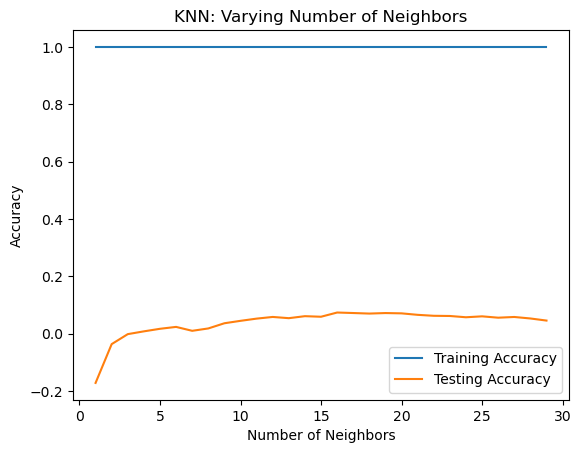

In [249]:
plt.title("KNN: Varying Number of Neighbors")
plt.plot(neighbors,knn_train_accuracies.values(),label="Training Accuracy")
plt.plot(neighbors,knn_test_accuracies.values(),label="Testing Accuracy")
plt.legend()
plt.xlabel("Number of Neighbors")
plt.ylabel("Accuracy")
plt.show()

In [250]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix,classification_report
knn=KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train_cat,y_train_cat)
y_pred=knn.predict(X_test_cat)
print(confusion_matrix(y_test_cat,y_pred))
print(classification_report(y_test_cat,y_pred))

[[11 28]
 [12 28]]
              precision    recall  f1-score   support

           0       0.48      0.28      0.35        39
           1       0.50      0.70      0.58        40

    accuracy                           0.49        79
   macro avg       0.49      0.49      0.47        79
weighted avg       0.49      0.49      0.47        79



C:\Users\brian\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



In [251]:
from sklearn.model_selection import cross_val_score,KFold
from sklearn.linear_model import LinearRegression
kf=KFold(n_splits=6,shuffle=True,random_state=1)
reg=LinearRegression()
cv_results=cross_val_score(reg,X,y,cv=kf)
cv_results

array([0.56385335, 0.79708557, 0.64417113, 0.67604137, 0.75690775,
       0.62463308])

In [252]:
mergedData.tail()

,open,high,low,close,adjusted_close,volume,sp_percent_change_daily,sp_percent_change_monthly,moving_average_200,moving_average_50,variance,rolling_average_volume,std_dev_100,upper_bound,lower_bound,smi,smi_signal,federal_funds_effective_rate_daily,ff_rate_change,personal_consumption_expenditures,pce_exp_percent_change_monthly,pce_exp_monthly_change_percentage,pce_exp_monthly_rate_of_change,pce_exp_percent_change_annual,personal_consumption_expenditures__chain_type_price_index,pce_percent_change_monthly,pce_monthly_change_percentage,pce_monthly_rate_of_change,pce_percent_change_annual,personal_consumption_expenditures_excluding_food_and_energy,corepce_percent_change_monthly,corepce_monthly_change_percentage,corepce_monthly_rate_of_change,corepce_percent_change_annual,consumer_price_index_for_all_urban_consumers__all_items_in_u_s__city_average,cpi_percent_change_monthly,cpi_percent_change_monthly_difference,cpi_monthly_rate_of_change,cpi_percent_change_annual,consumer_price_index_for_all_urban_consumers__all_items_less_food_and_energy_in_u_s__city_average,core_cpi_percent_change_monthly,core_cpi_percent_change_monthly_difference,core_cpi_monthly_rate_of_change,core_cpi_percent_change_annual,producer_price_index_by_commodity_final_demand,ppi_percent_change_monthly,ppi_rate_of_monthly_change,ppi_percent_change_annual,ice_bofa_bbb_us_corporate_index_effective_yield,ice_bofa_us_high_yield_index_option_adjusted_spread,personal_saving_rate,personal_saving_rate_monthly_change,personal_saving_rate_rate_of_monthly_change,all_employees_manufacturing,all_employees_manufacturing_monthly_change,all_employees_manufacturing_rate_of_monthly_change,advance_retail_sales__retail_trade_and_food_services,retail_rate_change,"consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks","consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks_monthly_dollar_change","consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks_monthly_rate_of_change",producer_price_index_by_commodity__special_indexes__copper_and_copper_products,producer_price_index_by_commodity__special_indexes__copper_and_copper_products_monthly_change,producer_price_index_by_commodity__special_indexes__copper_and_copper_products_rate_of_monthly_change,all_employees_total_nonfarm,emp_monthly_change,emp_rate_of_monthly_change,cboe_s&p_500_3_month_volatility_index,cboe_s&p_500_3_month_volatility_index_monthly_change,cboe_s&p_500_3_month_volatility_index_rate_of_monthly_change,fed_balance_sheet_assets,balance_sheet_percent_change_weekly,balance_sheet_rate_of_weekly_change,balance_sheet_percent_change_annual,initial_claims,claims_monthly_change,claims_rate_of_monthly_change,10_year_treasury_constant_maturity_minus_3_month_treasury_constant_maturity,"market_yield_on_u_s__treasury_securities_at_10_year_constant_maturity,_quoted_on_an_investment_basis",daily_change,federal_debt__total_public_debt_as_percent_of_gross_domestic_product,federal_debt__total_public_debt_as_percent_of_gross_domestic_product_monthly_change,federal_debt__total_public_debt_as_percent_of_gross_domestic_rate_of_monthly_change,"liabilities_and_capital__liabilities__deposits_with_f_r__banks,_other_than_reserve_balances__u_s__treasury,_general_account__week_average",tga_monthly_change,tga_rate_of_monthly_change,overnight_reverse_repurchase_agreements__total_securities_sold_by_the_federal_reserve_in_the_temporary_open_market_operations,reverse_repurchase_agreement_monthly_change,reverse_repurchase_rate_of_monthly_change,nominal_broad_u_s__dollar_index,nominal_broad_u_s__dollar_index_daily_change,nominal_broad_u_s__dollar_index_rate_of_daily_change,nominal_broad_u_s__dollar_index_monthly_change,next_day,next_day_percent_change,target,lasso_prediction,lasso_prediction_SPY_difference,lasso_next_day,lasso_percent_change,lasso_target,ada_boost_prediction,ada_boost_next_day,ada_boost_target,gradient_boost_prediction,gradient_boost_next_day,gradient_boost_target,LSTM_prediction,

In [253]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import BaggingClassifier
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression


model_rf=RandomForestClassifier(min_samples_leaf=2, random_state=1)

x=mergedData.iloc[:,:-22]
y_cat=ss_mergedData["target"].values
y_cat=y_cat.reshape(-1,1)
y=mergedData["target"]

x_train_rf, x_test_rf,y_train_rf,y_test_rf=train_test_split(x,y, test_size=0.30,random_state=1)

#model_cat.fit(x_train_rf,y_train_rf)
model_rf.fit(x_train_rf, y_train_rf)

RandomForestClassifier(min_samples_leaf=2, random_state=1)

In [254]:
preds=model_rf.predict(x_test_rf)
preds=pd.Series(preds, index=y_test_rf.index,name="predictions")
preds.shape

(79,)

In [255]:
sklearn.metrics.confusion_matrix(y_test_rf,preds,labels=[1,0])
#sklearn.metrics.confusion_matrix(mergedData["target"],mergedData['rf_target'],labels=[1,0])

array([[28, 12],
       [28, 11]], dtype=int64)

In [256]:
sklearn.metrics.accuracy_score(y_test_rf,preds)

0.4936708860759494

In [257]:
sklearn.metrics.precision_score(y_test_rf,preds)

0.5

In [258]:
sklearn.metrics.f1_score(y_test_rf,preds)

0.5833333333333334

In [259]:
sklearn.metrics.recall_score(y_test_rf,preds)

0.7

In [260]:
sklearn.metrics.matthews_corrcoef(y_test_rf,preds)

-0.019753215450257794

In [261]:
sklearn.metrics.classification_report(y_test_rf,preds)

'              precision    recall  f1-score   support\n\n           0       0.48      0.28      0.35        39\n           1       0.50      0.70      0.58        40\n\n    accuracy                           0.49        79\n   macro avg       0.49      0.49      0.47        79\nweighted avg       0.49      0.49      0.47        79\n'

In [262]:
importances_rf=pd.Series(model_rf.feature_importances_,index=x.columns)
sorted_importances_rf=importances_rf.sort_values()
impLine=px.line(sorted_importances_rf,x=sorted_importances_rf.index,y=sorted_importances_rf.values)
impLine.show()

In [263]:
mergedData['random_forest_target']=model_rf.predict(x)
mergedData['average_day_prediction']=((mergedData['gradient_boost_prediction']+mergedData['ada_boost_prediction']+mergedData['lasso_prediction']+mergedData['LSTM_prediction'])/4)
mergedData['average_next_day_prediction']=((mergedData['gradient_boost_next_day']+mergedData['ada_boost_next_day']+mergedData['lasso_next_day']+mergedData['LSTM_prediction'])/4)
mergedData['consensus']=((mergedData['target']*1.5)+(mergedData['lasso_target']*1.5)+mergedData['ada_boost_target']+mergedData['gradient_boost_target']+(mergedData['random_forest_target']+mergedData['LSTM_target']))
mergedData['overall_target']=mergedData['consensus'].apply(lambda x: 1 if x >= 3.5 else 0 )
mergedData['overall_forecast']=np.where(mergedData["target"]==mergedData["overall_target"],"Correct","Incorrect")
mergedData.tail(10)
#heavier weight given towared KNN imputer and random forest

,open,high,low,close,adjusted_close,volume,sp_percent_change_daily,sp_percent_change_monthly,moving_average_200,moving_average_50,variance,rolling_average_volume,std_dev_100,upper_bound,lower_bound,smi,smi_signal,federal_funds_effective_rate_daily,ff_rate_change,personal_consumption_expenditures,pce_exp_percent_change_monthly,pce_exp_monthly_change_percentage,pce_exp_monthly_rate_of_change,pce_exp_percent_change_annual,personal_consumption_expenditures__chain_type_price_index,pce_percent_change_monthly,pce_monthly_change_percentage,pce_monthly_rate_of_change,pce_percent_change_annual,personal_consumption_expenditures_excluding_food_and_energy,corepce_percent_change_monthly,corepce_monthly_change_percentage,corepce_monthly_rate_of_change,corepce_percent_change_annual,consumer_price_index_for_all_urban_consumers__all_items_in_u_s__city_average,cpi_percent_change_monthly,cpi_percent_change_monthly_difference,cpi_monthly_rate_of_change,cpi_percent_change_annual,consumer_price_index_for_all_urban_consumers__all_items_less_food_and_energy_in_u_s__city_average,core_cpi_percent_change_monthly,core_cpi_percent_change_monthly_difference,core_cpi_monthly_rate_of_change,core_cpi_percent_change_annual,producer_price_index_by_commodity_final_demand,ppi_percent_change_monthly,ppi_rate_of_monthly_change,ppi_percent_change_annual,ice_bofa_bbb_us_corporate_index_effective_yield,ice_bofa_us_high_yield_index_option_adjusted_spread,personal_saving_rate,personal_saving_rate_monthly_change,personal_saving_rate_rate_of_monthly_change,all_employees_manufacturing,all_employees_manufacturing_monthly_change,all_employees_manufacturing_rate_of_monthly_change,advance_retail_sales__retail_trade_and_food_services,retail_rate_change,"consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks","consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks_monthly_dollar_change","consumer_loans__credit_cards_and_other_revolving_plans,_all_commercial_banks_monthly_rate_of_change",producer_price_index_by_commodity__special_indexes__copper_and_copper_products,producer_price_index_by_commodity__special_indexes__copper_and_copper_products_monthly_change,producer_price_index_by_commodity__special_indexes__copper_and_copper_products_rate_of_monthly_change,all_employees_total_nonfarm,emp_monthly_change,emp_rate_of_monthly_change,cboe_s&p_500_3_month_volatility_index,cboe_s&p_500_3_month_volatility_index_monthly_change,cboe_s&p_500_3_month_volatility_index_rate_of_monthly_change,fed_balance_sheet_assets,balance_sheet_percent_change_weekly,balance_sheet_rate_of_weekly_change,balance_sheet_percent_change_annual,initial_claims,claims_monthly_change,claims_rate_of_monthly_change,10_year_treasury_constant_maturity_minus_3_month_treasury_constant_maturity,"market_yield_on_u_s__treasury_securities_at_10_year_constant_maturity,_quoted_on_an_investment_basis",daily_change,federal_debt__total_public_debt_as_percent_of_gross_domestic_product,federal_debt__total_public_debt_as_percent_of_gross_domestic_product_monthly_change,federal_debt__total_public_debt_as_percent_of_gross_domestic_rate_of_monthly_change,"liabilities_and_capital__liabilities__deposits_with_f_r__banks,_other_than_reserve_balances__u_s__treasury,_general_account__week_average",tga_monthly_change,tga_rate_of_monthly_change,overnight_reverse_repurchase_agreements__total_securities_sold_by_the_federal_reserve_in_the_temporary_open_market_operations,reverse_repurchase_agreement_monthly_change,reverse_repurchase_rate_of_monthly_change,nominal_broad_u_s__dollar_index,nominal_broad_u_s__dollar_index_daily_change,nominal_broad_u_s__dollar_index_rate_of_daily_change,nominal_broad_u_s__dollar_index_monthly_change,next_day,next_day_percent_change,target,lasso_prediction,lasso_prediction_SPY_difference,lasso_next_day,lasso_percent_change,lasso_target,ada_boost_prediction,ada_boost_next_day,ada_boost_target,gradient_boost_prediction,gradient_boost_next_day,gradient_boost_target,LSTM_prediction,

In [264]:
dailyPercentChange=mergedData.loc[current_year,'next_day_percent_change']
avgDPC=dailyPercentChange.mean()
avgDPC

0.060113224704457395

In [265]:
X=mergedData.iloc[:,:-19]


y=mergedData["next_day"].values
y=y.reshape(-1,1)
y=mergedData[["next_day"]]
y_cat=mergedData['target'].values
y_cat=y_cat.reshape(-1,1)
X_train_cat,X_test_cat,y_train_cat,y_test_cat=train_test_split(X,y_cat,test_size=0.3,random_state=1,shuffle=True)
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=1,shuffle=True)

In [266]:
#Entire Population
sklearn.metrics.confusion_matrix(mergedData["target"],mergedData["overall_target"],labels=[1,0])

array([[143,   3],
       [ 25,  91]], dtype=int64)

In [267]:
print(sklearn.metrics.accuracy_score(mergedData["target"],mergedData["overall_target"]))

print(sklearn.metrics.precision_score(mergedData["target"],mergedData["overall_target"],labels=[1,0]))

print(sklearn.metrics.f1_score(mergedData["target"],mergedData["overall_target"],labels=[1,0]))

print(sklearn.metrics.recall_score(mergedData["target"],mergedData["overall_target"],labels=[1,0]))

print(sklearn.metrics.matthews_corrcoef(mergedData["target"],mergedData["overall_target"]))

0.8931297709923665
0.8511904761904762
0.910828025477707
0.9794520547945206
0.7911214440962209


In [268]:
#TestSet
OverallTestTarget=mergedData.loc[X_test.index,'overall_target']
OverallTestTarget=OverallTestTarget.reset_index(drop=True)
OverallTestTarget=pd.array(OverallTestTarget)
OverallTestTarget=OverallTestTarget.reshape(-1,1)
sklearn.metrics.confusion_matrix(y_test_cat,OverallTestTarget,labels=[1,0])

array([[39,  1],
       [10, 29]], dtype=int64)

In [275]:
print(sklearn.metrics.accuracy_score(y_test_cat,OverallTestTarget))

print(sklearn.metrics.precision_score(y_test_cat,OverallTestTarget,labels=[1,0]))

print(sklearn.metrics.f1_score(y_test_cat,OverallTestTarget,labels=[1,0]))

print(sklearn.metrics.recall_score(y_test_cat,OverallTestTarget,labels=[1,0]))

print(sklearn.metrics.matthews_corrcoef(y_test_cat,OverallTestTarget,))

0.8607594936708861
0.7959183673469388
0.8764044943820225
0.975
0.7402606190100974


In [279]:
mergedData.to_csv(r'C:\Users\brian\Documents\DailyFinancialData.csv',header=True)

In [286]:
#%history

In [296]:
#identify continous variable for linear regression: next_month
mod=smf.ols("next_day~ open+high+low+close+volume+consumer_price_index_for_all_urban_consumers__all_items_in_u_s__city_average+cpi_percent_change_monthly+cpi_percent_change_monthly_difference+cpi_monthly_rate_of_change+cpi_percent_change_annual+personal_consumption_expenditures_excluding_food_and_energy+corepce_percent_change_monthly+corepce_monthly_change_percentage+corepce_monthly_rate_of_change+corepce_percent_change_annual+personal_consumption_expenditures__chain_type_price_index+pce_percent_change_monthly+pce_monthly_change_percentage+pce_monthly_rate_of_change+pce_percent_change_annual+federal_funds_effective_rate_daily+ff_rate_change+ice_bofa_bbb_us_corporate_index_effective_yield+all_employees_manufacturing+all_employees_manufacturing_monthly_change+all_employees_manufacturing_rate_of_monthly_change", data=mergedData).fit()
mod.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               next_day   R-squared:                       0.921
Model:                            OLS   Adj. R-squared:                  0.916
Method:                 Least Squares   F-statistic:                     221.0
Date:                Wed, 23 Jul 2025   Prob (F-statistic):          3.47e-128
Time:                        14:10:44   Log-Likelihood:                -935.13
No. Observations:                 262   AIC:                             1898.
Df Residuals:                     248   BIC:                             1948.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
================================================================================================================================================
                                                                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------------------------
Intercept                                                                       -0.0311      0.030     -1.050      0.295      -0.090       0.027
open                                                                             0.7277      0.253      2.877      0.004       0.229       1.226
high                                                                             0.2541      0.369      0.688      0.492      -0.473       0.982
low                                                                             -0.7342      0.295     -2.485      0.014      -1.316      -0.152
close                                                                            0.8888      0.275      3.235      0.001       0.348       1.430
volume                                                                       -4.101e-08   4.12e-08     -0.996      0.320   -1.22e-07    4.01e-08
consumer_price_index_for_all_urban_consumers__all_items_in_u_s__city_average    -0.1884      0.681     -0.277      0.782      -1.529       1.152
cpi_percent_change_monthly                                                      -1.3295      0.914     -1.455      0.147      -3.129       0.470
cpi_percent_change_monthly_difference                                           -0.4260      0.265     -1.609      0.109      -0.948       0.096
cpi_monthly_rate_of_change                                                      -3.0109      2.059     -1.462      0.145      -7.066       1.044
cpi_percent_change_annual                                                       -1.3135      0.797     -1.648      0.101      -2.883       0.256
personal_consumption_expenditures_excluding_food_and_energy                     -0.4100      1.217     -0.337      0.737      -2.807       1.987
corepce_percent_change_monthly                                                  -0.8325      0.606     -1.374      0.171      -2.026       0.361
corepce_monthly_change_percentage                                                0.6870      0.862      0.797      0.426      -1.012       2.386
corepce_monthly_rate_of_change                                                   2.9126      3.552      0.820      0.413      -4.083       9.908
corepce_percent_change_annual                                                   -1.7833      1.739     -1.025      0.306      -5.209       1.642
personal_consumption_expenditures__chain_type_price_index                        0.3723      0.270      1.381      0.168      -0.159       0.903
pce_percent_change_monthly                                                      -1.1832      0.869     -1.362      0.174      -2.894       0.528
pce_monthly_change_percentage         